In [1]:
cd ..

m:\OneDrive\Projects\federated_imputation_pc2


## Loading

In [24]:
%load_ext autoreload
%autoreload
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from dython.nominal import correlation_ratio
import missingno as msno
from src.fed_imp.sub_modules.missing_simulate.missing_adder_new import simulate_nan_new
from src.modules.evaluation.imputation_quality import rmse, ws_cols, sliced_ws
from src.notebook_utils import (
    visualize_ms, run_pred, sklearn_evaluation, NN_evaluation,
    run_simulation, simulate_scenario
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
experiment_config_template = {
  "num_clients": 3,
  "data": {
    "dataset_name": "nhis_income_pca",
    "normalize": True,
  },
  "handle_imbalance": None,
  "data_partition": {
    "strategy": "sample@p=4000",
    "params": {}
  },
  "missing_simulate": {
    "mr_strategy": "fixed",
    "mf_strategy": "all",
    "mm_strategy": "mnar_lr"
  },
  "imputation": {
    "initial_strategy_num": "mean",
    "initial_strategy_cat": "mode",
    "estimator_num": "ridge_cv",
    "estimator_cat": "logistic_cv",
    "imp_evaluation_model": "logistic",
    "imp_evaluation_params": {
      "tune_params": "gridsearch"
    },
    "clip": True
  },
  "agg_strategy_imp": {
    "strategy": "fedavg-s",
    "params": {
      "ms_field": "missing_cell_pct",
      "beta": 0.7
    }
  },
  "server_type": "fedavg_pytorch",
  "server": {
    "impute_mode": "instant",
    "imp_round": 20,
    "imp_local_epochs": 0,
    "pred_round": 0,
    "pred_local_epochs": 0,
    "model_fit_mode": "one_shot",
    "froze_ms_coefs_round": 20
  },
  "pred_model": {
    "model_params": {
      "model": "2nn",
      "num_hiddens": 64,
      "model_init_config": None,
      "model_other_params": None
    },
    "train_params": {
      "batch_size": 128,
      "learning_rate": 0.001,
      "weight_decay": 0.0000,
      "pred_round": 200,
      "pred_local_epochs": 3
    }
  },
  "experiment": {
    "n_rounds": 1,
    "seed": 102931466,
    "mtp": False,
    "random_seed": 50,
    "num_process": 3,
    "test_size": 0.1,
    "track": True
  },
  "tune_params": False,
  "track": False,
  "tune_params": True,
  "prediction": False,
  "save_state": False,
  "test_size": 0.1,
  "algo_params": {
    "local": {},
    "fedavg-s": {},
    "fedwavg": {
      "alpha": 0.9
    },
    "fedmechw": {
      "client_thres": 1.0,
      "alpha": 1.0,
      "beta": 0.0,
      "scale_factor": 4
    },
    "fedmechw_new": {
      "client_thres": 1.0,
      "alpha": 1.0,
      "gamma": 0.0,
      "scale_factor": 4
    },
    "fedmechw_new2": {
      "client_thres": 1.0,
      "alpha": 1.0,
      "gamma": 0.0,
      "scale_factor": 4,
      "s_thres": 200,
      "s_steep": 0.02
    },
    "fedmechclw": {
      "client_thres": 0.2,
      "thres1": 0.2,
      "alpha": 0.5
    },
    'testavg':{
        
    },
    'testavg2':{
        
    },
    'testavg3':{
        
    },
    "scale_factor": 4
  }
}

server_config_tmpl = {
    "server_name": 'fedavg_mlp_pytorch_pred',
    "server_pred_config": {
        "model_params": {
            "model": "2nn",
            "num_hiddens": 32,
            "model_init_config": None,
            "model_other_params": None
        },
        "train_params": {
            "batch_size": 300,
            "learning_rate": 0.001,
            "weight_decay": 0.0,
            "pred_round": 500,
            "pred_local_epochs": 3,
            'local_epoch': 5,
            'sample_pct': 1
        }
    },
    "server_config": {
        'pred_rounds': 1,
        'seed': 21
    }
}

In [60]:
trackers['tests1_1']

In [65]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances

def vis_local_model_sim(tracker, iteration, model = 'local', metric = 'cos'):
    n_cols = 5
    n_rows = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(n_rows * n_cols):
        clients_records = [item for item in tracker.records if item.iteration == iteration and item.feature_idx == feature_idx]
        if model == 'local':
            X = clients_records[0].local_imp_model_params
        elif model == 'mm':
            X = clients_records[0].local_mm_model_params
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        if metric == 'cos':
            cosine_sim = 1 - (cosine_similarity(X) + 1)/2
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        elif metric == 'l2':
            cosine_sim = euclidean_distances(X)
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax)
        else:
            raise NotImplementedError
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("{}".format(model))
    plt.tight_layout()
    plt.show()

In [8]:
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
def vis_mm_sim(mm_coefs, metric = 'cos'):
    n_cols = 5
    n_rows = (mm_coefs.shape[0] - 1) // n_cols + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(mm_coefs.shape[0]):
        
        X = mm_coefs[feature_idx]
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        if metric == 'cos':
            cosine_sim = 1 - (cosine_similarity(X) + 1)/2
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        else:
            raise NotImplementedError
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("Mechanism Similarity")
    plt.tight_layout()
    plt.show()

10 0.14185106490048777
50 0.2689414213699951
100 0.5
200 0.8807970779778823
500 0.9996646498695336
1000 0.9999999847700205


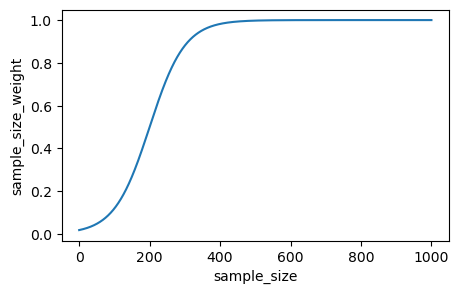

In [9]:
def sigmoid(x, thres, steep):
    return 1 / (1 + np.exp(-steep * (x - thres)))

for x in np.array([10, 50, 100, 200, 500, 1000]):
    print(x, sigmoid(x, 100, 0.02))
    
fig, ax = plt.subplots(1, 1, figsize=(5, 3))
x = np.arange(0, 1000, 0.1)
y = sigmoid(x, 200, 0.02)
ax.plot(x, y)
ax.set_xlabel("sample_size")
ax.set_ylabel("sample_size_weight")
plt.show()

# Heart

In [19]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

## Clients MNAR LR - Balanced

### Simple Averaging

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(319795, 25)
(54746, 25)
(54746, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 14:31:39.652 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:31:39.652 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 14:32:38.235 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:32:38.236 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 14:33:40.482 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:33:40.483 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 14:33:46.788 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 129.70961640001042


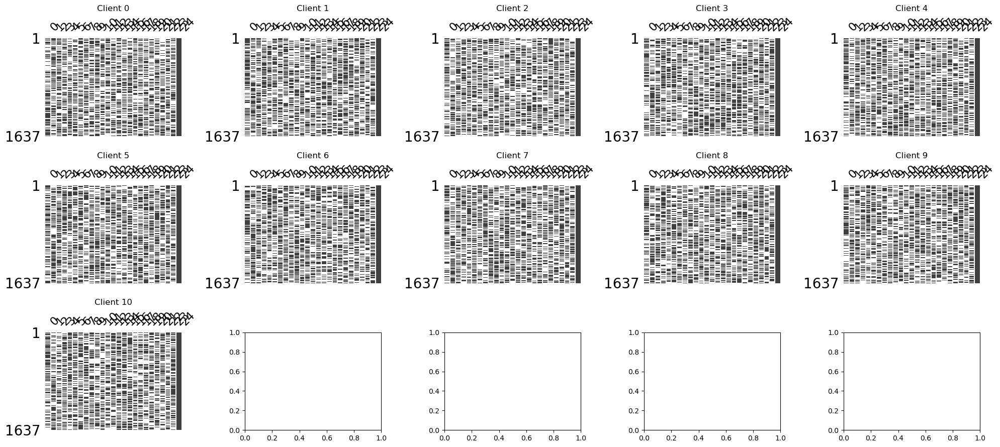

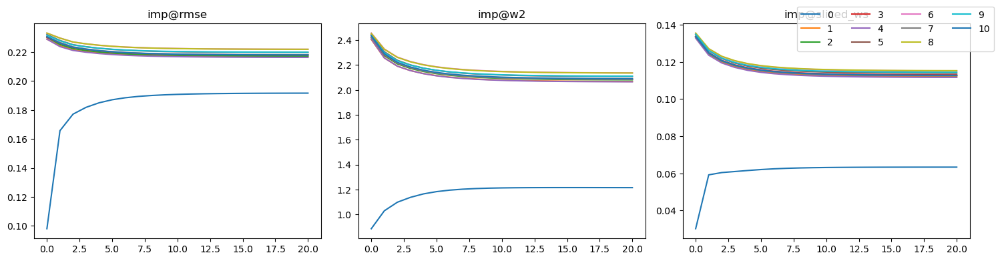

{'imp@rmse': 0.21634214402831575, 'imp@ws': 2.0175549716075336, 'imp@sliced_ws': 0.10884745887623519}


In [9]:
name = 'mnar_lr_heart_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart_balanced'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [11]:
pred_ret = NN_evaluation(
    rets['mnar_lr_heart_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

2023-08-13 14:36:26.815 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.7065, test_f1: 0.6960 test_auroc: 0.7642 train_loss: 0.6501 val_accu: 0.6452 val_f1: 0.6423 test recall 0.6747 precision 0.7187 b-accu 0.7064
2023-08-13 14:36:26.976 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.7145, test_f1: 0.7123 test_auroc: 0.7750 train_loss: 0.6196 val_accu: 0.6535 val_f1: 0.6524 test recall 0.7098 precision 0.7149 b-accu 0.7145
2023-08-13 14:36:27.139 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.7175, test_f1: 0.7285 test_auroc: 0.7791 train_loss: 0.6158 val_accu: 0.6572 val_f1: 0.6571 test recall 0.7610 precision 0.6986 b-accu 0.7177
2023-08-13 14:36:27.292 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 3, test_accu: 0.7005, test_f1: 0.7271 test_aur

0.727 0.792554680874894 0.7476066144473454


### Ours

In [20]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart_balanced'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  30
config2["server"]["imp_round"] = 20

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(319795, 25)
(54746, 25)
(54746, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
sample sizes:  [6000, 6000, 6000]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-11-03 17:15:23.012 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:15:23.013 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 17:17:23.848 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:17:23.849 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10


KeyboardInterrupt: 

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(319795, 25)
(54746, 25)
(54746, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
sample sizes:  [1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637, 1637]
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-11-03 17:11:27.282 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:11:27.282 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1


1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
1 before
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
2 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
3 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
4 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
5 after
6 after
6 after


2023-11-03 17:12:30.325 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:12:30.326 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10


10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
10 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
11 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
12 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
13 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
14 after
1

2023-11-03 17:13:35.386 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:13:35.387 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20


20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after
20 after


2023-11-03 17:13:41.892 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 137.15843920013867


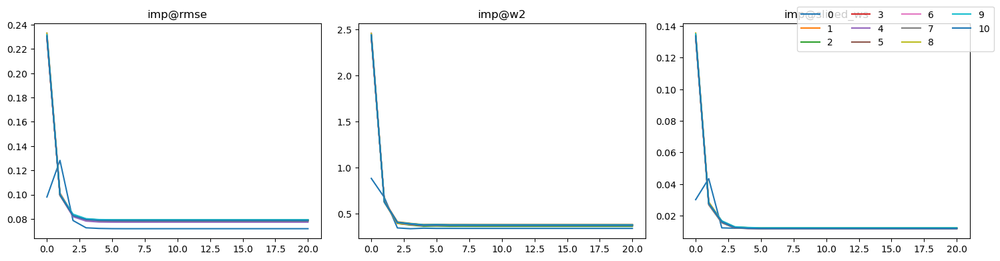

{'imp@rmse': 0.07807853563139096, 'imp@ws': 0.37430716892037824, 'imp@sliced_ws': 0.012015302798035726}


In [16]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart_balanced'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  1
config2["server"]["imp_round"] = 20

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

## Clients MNAR RL Balanced

### SimpleAVG

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(319795, 25)
(54746, 25)
(54746, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 14:42:47.168 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:42:47.169 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 14:43:46.704 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:43:46.704 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 14:44:52.728 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:44:52.728 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 14:44:59.382 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 134.8136635999981


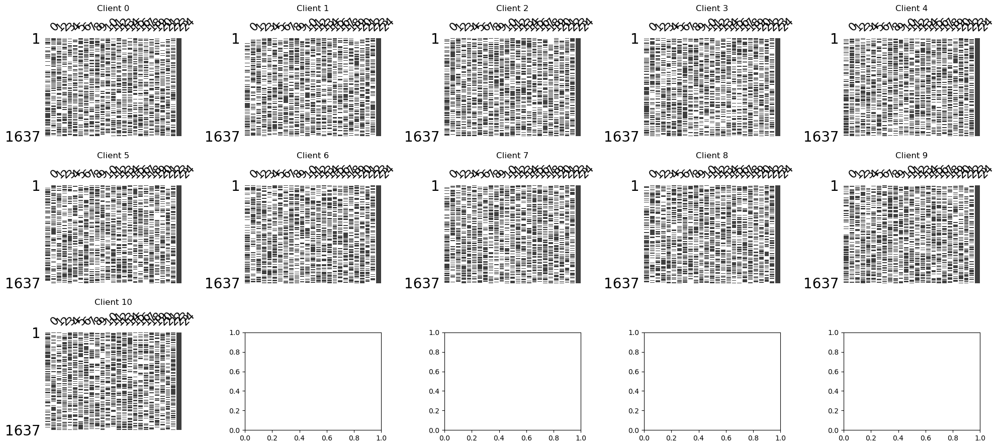

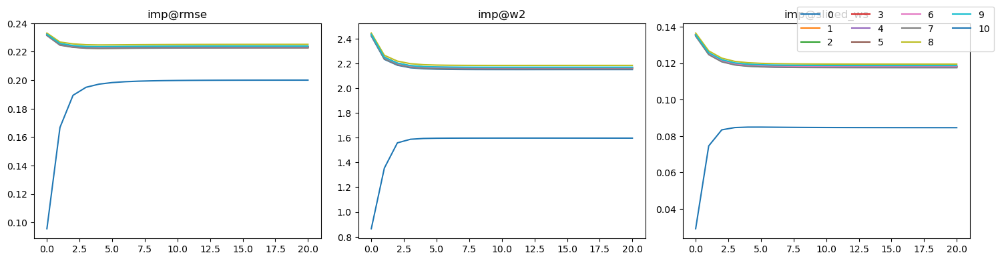

{'imp@rmse': 0.2212809520152537, 'imp@ws': 2.1103560548582436, 'imp@sliced_ws': 0.11510169667107512}


In [15]:
name = 'mnar_rl_heart_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart_balanced'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [17]:
pred_ret = NN_evaluation(
    rets['mnar_rl_heart_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

2023-08-13 14:49:09.204 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.6840, test_f1: 0.6075 test_auroc: 0.7715 train_loss: 0.6673 val_accu: 0.6560 val_f1: 0.6464 test recall 0.4910 precision 0.7964 b-accu 0.6832
2023-08-13 14:49:17.388 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.7545, test_f1: 0.7566 test_auroc: 0.8231 train_loss: 0.5720 val_accu: 0.7051 val_f1: 0.7051 test recall 0.7661 precision 0.7473 b-accu 0.7545
2023-08-13 14:49:25.591 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.7490, test_f1: 0.7407 test_auroc: 0.8184 train_loss: 0.5617 val_accu: 0.7065 val_f1: 0.7060 test recall 0.7199 precision 0.7628 b-accu 0.7489
2023-08-13 14:49:33.829 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.7470, test_f1: 0.7345 tes

0.7585 0.8261202179234868 0.7579952267303103


### OUR

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(319795, 25)
(54746, 25)
(54746, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 14:50:46.243 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:50:46.243 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 14:51:53.293 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:51:53.294 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 14:52:58.954 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:52:58.955 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 14:53:05.483 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 141.78050209999492


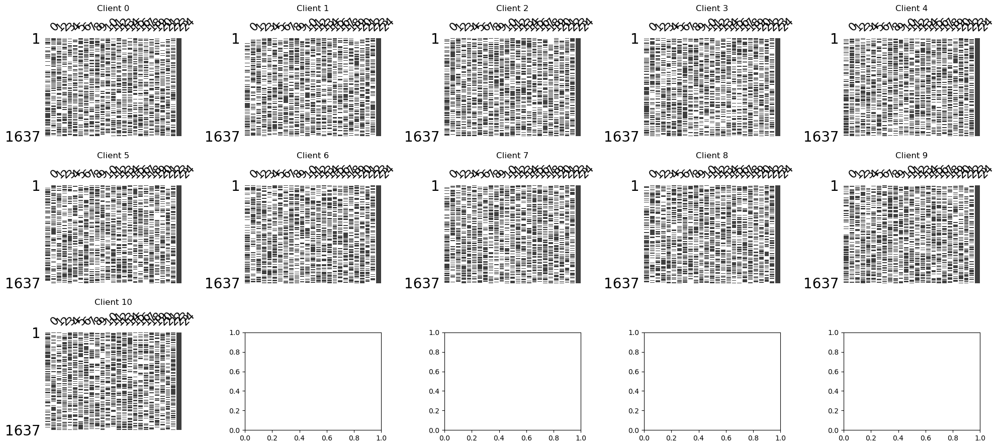

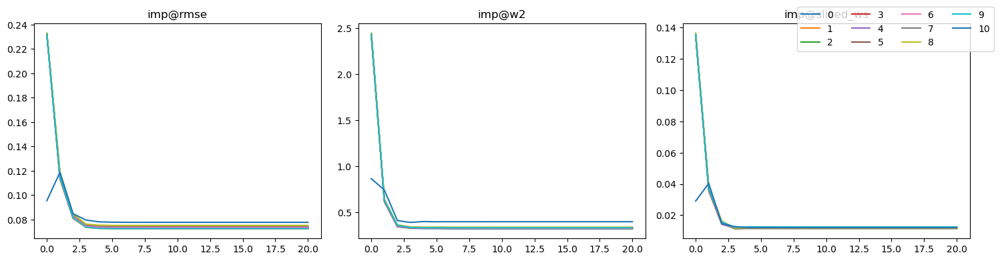

{'imp@rmse': 0.0738854690892709, 'imp@ws': 0.336044513652901, 'imp@sliced_ws': 0.011931119132901449}


In [18]:
name = 'mnar_rl_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart_balanced'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [19]:
pred_ret = NN_evaluation(
    rets['mnar_rl_heart_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

2023-08-13 14:53:07.274 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.7490, test_f1: 0.7426 test_auroc: 0.8237 train_loss: 0.6195 val_accu: 0.7203 val_f1: 0.7200 test recall 0.7269 precision 0.7589 b-accu 0.7489
2023-08-13 14:53:15.424 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.7710, test_f1: 0.7842 test_auroc: 0.8405 train_loss: 0.5165 val_accu: 0.7489 val_f1: 0.7483 test recall 0.8353 precision 0.7389 b-accu 0.7713
2023-08-13 14:53:23.637 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.7575, test_f1: 0.7512 test_auroc: 0.8394 train_loss: 0.5038 val_accu: 0.7356 val_f1: 0.7349 test recall 0.7349 precision 0.7681 b-accu 0.7574
2023-08-13 14:53:31.801 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.7610, test_f1: 0.7610 tes

0.771 0.84312549000784 0.7841658812441092


## Client MNAR LR - Raw

### Simple Avg

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 14:57:06.543 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:57:06.544 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 14:58:02.060 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:58:02.061 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 14:59:04.074 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 14:59:04.075 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 14:59:10.288 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 126.38341049999872


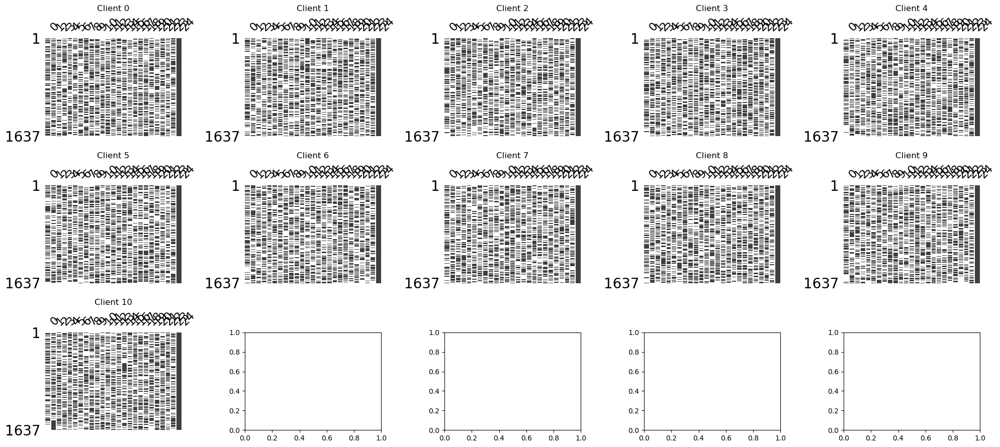

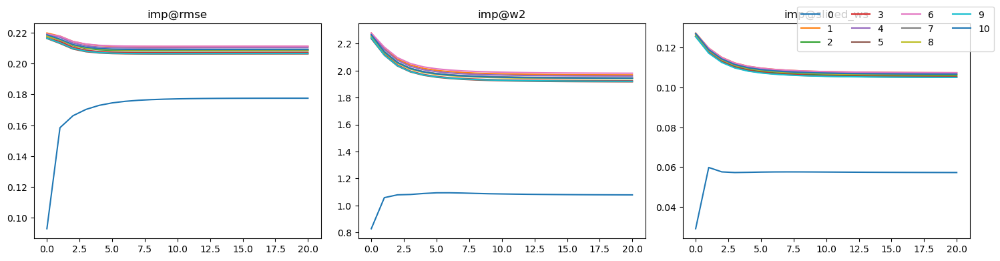

{'imp@rmse': 0.20590843793374664, 'imp@ws': 1.865610152725503, 'imp@sliced_ws': 0.10187521876361198}


In [20]:
name = 'mnar_lr_heart_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [37]:
pred_ret = NN_evaluation(
    rets['mnar_lr_heart_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl, imbalance='smotetm',
)

2023-08-13 15:49:57.287 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.5865, test_f1: 0.2636 test_auroc: 0.7789 train_loss: 0.6332 val_accu: 0.6635 val_f1: 0.6634 test recall 0.8177 precision 0.1571 b-accu 0.6906
2023-08-13 15:50:11.844 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.6955, test_f1: 0.2707 test_auroc: 0.7368 train_loss: 0.5078 val_accu: 0.7491 val_f1: 0.7490 test recall 0.6243 precision 0.1728 b-accu 0.6634
2023-08-13 15:50:26.620 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.6810, test_f1: 0.2733 test_auroc: 0.7293 train_loss: 0.4793 val_accu: 0.7740 val_f1: 0.7740 test recall 0.6630 precision 0.1722 b-accu 0.6729
2023-08-13 15:50:41.413 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.6495, test_f1: 0.2613 tes

0.774 0.7790207113981029 0.2981366459627329


### Ours

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 15:04:01.256 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:04:01.256 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 15:05:02.320 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:05:02.320 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 15:06:08.788 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:06:08.789 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 15:06:15.470 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 136.9062711000006


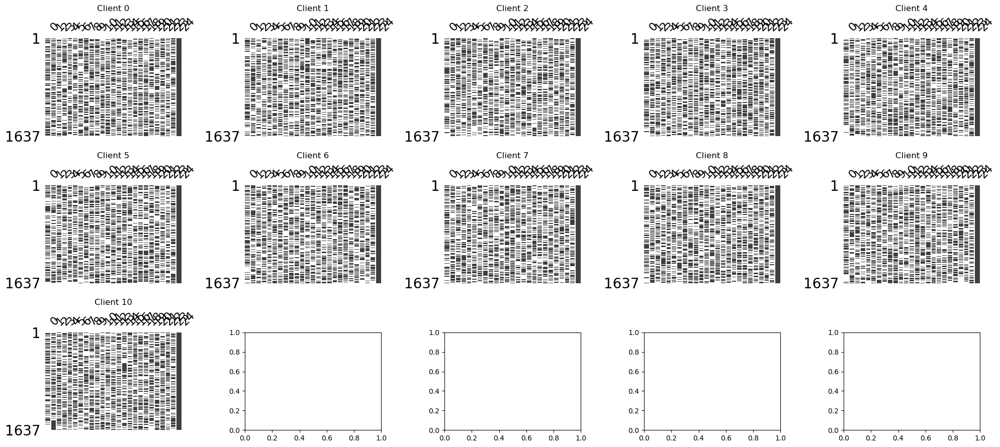

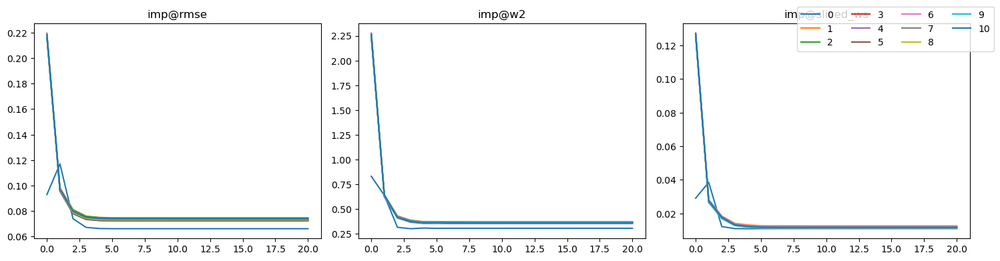

{'imp@rmse': 0.07274017312714834, 'imp@ws': 0.3546187635271738, 'imp@sliced_ws': 0.011715771096386622}


m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-08-13 15:06:17.519 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.9095, test_f1: 0.0000 test_auroc: 0.7444 train_loss: 0.3318 val_accu: 0.9085 val_f1: 0.4760 test recall 0.0000 precision 0.0000 b-accu 0.5000
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-def

0.9135 0.8266866926457679 0.2471042471042471


In [23]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [35]:
pred_ret = NN_evaluation(
    rets['mnar_lr_heart_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl, imbalance='smotetm',
)

2023-08-13 15:44:33.284 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.7490, test_f1: 0.3581 test_auroc: 0.8193 train_loss: 0.5878 val_accu: 0.7320 val_f1: 0.7318 test recall 0.7735 precision 0.2329 b-accu 0.7600
2023-08-13 15:44:47.887 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.8550, test_f1: 0.2033 test_auroc: 0.6904 train_loss: 0.3617 val_accu: 0.8231 val_f1: 0.8218 test recall 0.2044 precision 0.2022 b-accu 0.5621
2023-08-13 15:45:02.919 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.8480, test_f1: 0.2083 test_auroc: 0.7005 train_loss: 0.3210 val_accu: 0.8582 val_f1: 0.8582 test recall 0.2210 precision 0.1970 b-accu 0.5657
2023-08-13 15:45:17.512 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.8070, test_f1: 0.2218 tes

0.881 0.8192954054653306 0.3766816143497758


## Clients MNAR RL RAW

### SimpleAvg

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 15:11:13.607 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:11:13.607 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 15:12:17.396 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:12:17.397 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 15:13:24.787 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:13:24.788 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 15:13:31.585 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 140.6510719999933


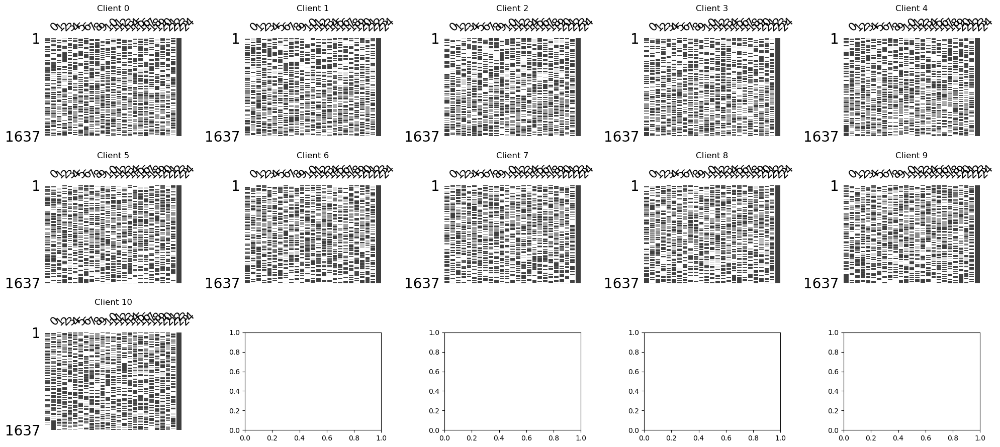

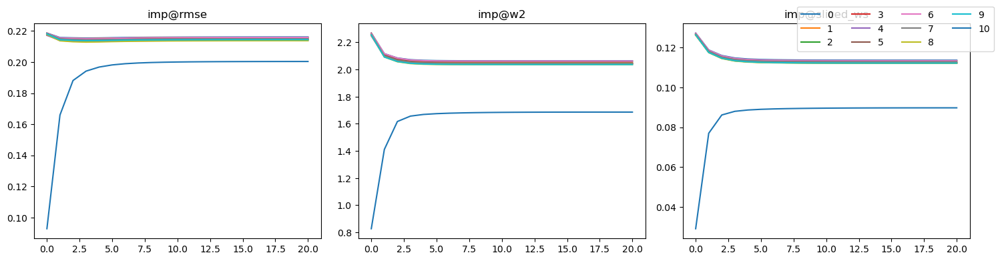

{'imp@rmse': 0.21365837633680304, 'imp@ws': 2.0148217129789936, 'imp@sliced_ws': 0.11063516681471813}


In [25]:
name = 'mnar_rl_heart_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [27]:
pred_ret = NN_evaluation(
    rets['mnar_rl_heart_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl, imbalance='smotetm',
)

2023-08-13 15:16:03.047 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.7705, test_f1: 0.3098 test_auroc: 0.7770 train_loss: 0.6490 val_accu: 0.6779 val_f1: 0.6759 test recall 0.5691 precision 0.2128 b-accu 0.6798
2023-08-13 15:16:17.497 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.8200, test_f1: 0.2771 test_auroc: 0.7335 train_loss: 0.5183 val_accu: 0.7499 val_f1: 0.7499 test recall 0.3812 precision 0.2177 b-accu 0.6224
2023-08-13 15:16:31.859 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.8210, test_f1: 0.2897 test_auroc: 0.7116 train_loss: 0.4991 val_accu: 0.7658 val_f1: 0.7657 test recall 0.4033 precision 0.2260 b-accu 0.6329
2023-08-13 15:16:47.504 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.8115, test_f1: 0.2792 tes

0.861 0.7840869398825776 0.33495934959349594


### Our

['BMI', 'PhysicalHealth', 'MentalHealth', 'SleepTime']
(319795, 25)
(20000, 25)
(18000, 25) (2000, 25)
(18000, 25)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 25)


2023-08-13 15:13:47.281 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:13:47.282 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 15:14:47.933 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:14:47.933 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 15:15:53.453 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:15:53.453 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 15:16:00.018 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 135.3985071999923


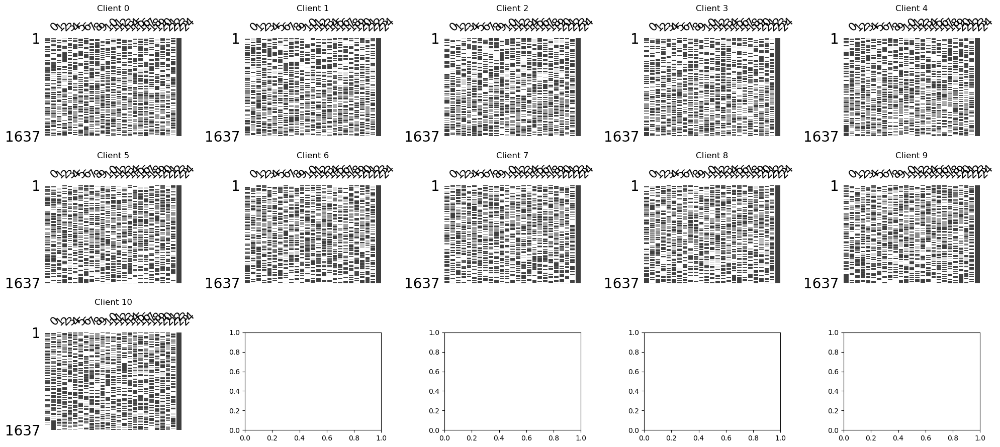

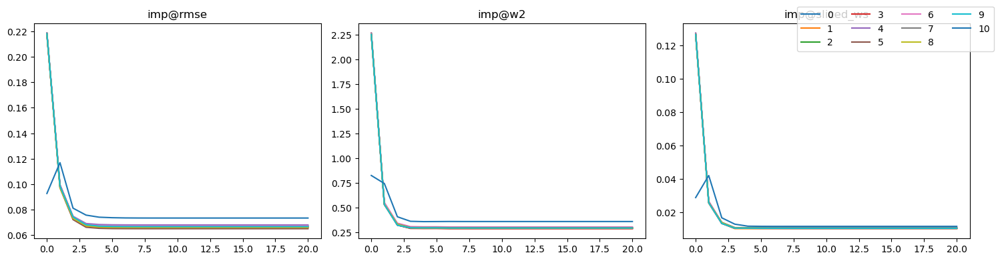

{'imp@rmse': 0.06710528456449294, 'imp@ws': 0.30127803771010836, 'imp@sliced_ws': 0.01078557309691197}


In [26]:
name = 'mnar_rl_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'heart'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [28]:
pred_ret = NN_evaluation(
    rets['mnar_rl_heart_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl, imbalance='smotetm',
)

2023-08-13 15:18:33.519 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.6935, test_f1: 0.3301 test_auroc: 0.8162 train_loss: 0.5944 val_accu: 0.7383 val_f1: 0.7376 test recall 0.8343 precision 0.2057 b-accu 0.7569
2023-08-13 15:18:48.863 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.8020, test_f1: 0.3196 test_auroc: 0.7635 train_loss: 0.3708 val_accu: 0.8294 val_f1: 0.8285 test recall 0.5138 precision 0.2319 b-accu 0.6722
2023-08-13 15:19:04.259 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.8515, test_f1: 0.3012 test_auroc: 0.7545 train_loss: 0.3300 val_accu: 0.8630 val_f1: 0.8629 test recall 0.3536 precision 0.2623 b-accu 0.6273
2023-08-13 15:19:19.805 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.8085, test_f1: 0.2947 tes

0.895 0.8182687956165582 0.36984352773826457


# CodRNA

In [8]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

## Clients MNAR LR

### Simple Avg

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-12 10:32:57.602 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 10:32:57.603 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 10:33:31.693 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 10:33:31.693 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 10:34:06.189 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 10:34:06.189 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 10:34:09.659 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 75.10189099999843


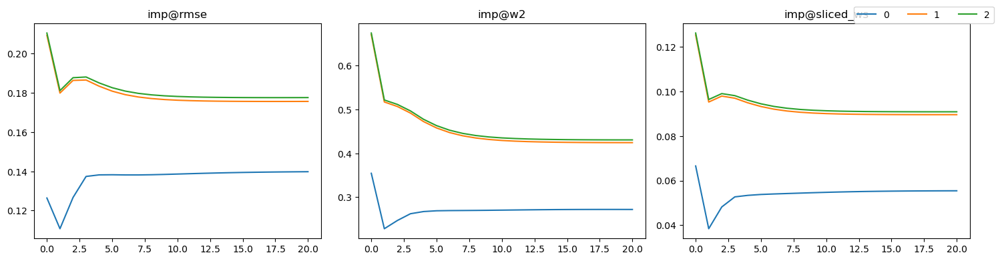

{'imp@rmse': 0.16423768300604788, 'imp@ws': 0.3755416388076843, 'imp@sliced_ws': 0.078617578823348}


2023-10-12 10:34:11.696 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6605, test_f1: 0.0000 test_auroc: 0.7695 test_auprc: 0.6423 train_loss: 0.6618 val_accu: 0.6600 val_f1: 0.3976
2023-10-12 10:34:21.652 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.8340, test_f1: 0.7191 test_auroc: 0.9025 test_auprc: 0.8396 train_loss: 0.4339 val_accu: 0.7783 val_f1: 0.7348
2023-10-12 10:34:31.975 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.8225, test_f1: 0.7044 test_auroc: 0.8938 test_auprc: 0.8252 train_loss: 0.4110 val_accu: 0.7925 val_f1: 0.7491
2023-10-12 10:34:42.377 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.8180, test_f1: 0.7016 test_auroc: 0.8929 test_auprc: 0.8188 train_loss: 0.4018 val_accu: 0.8033 val_f1: 0.7725
2023-1

0.846 0.7344827586206897 0.9804985512158304 0.954352309057567


In [9]:
name = 'mnar_lr_codrna_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary Purely

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-12 12:09:30.421 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:09:30.422 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:10:05.716 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:10:05.717 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:10:41.566 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:10:41.566 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:10:45.159 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 77.87785829999484


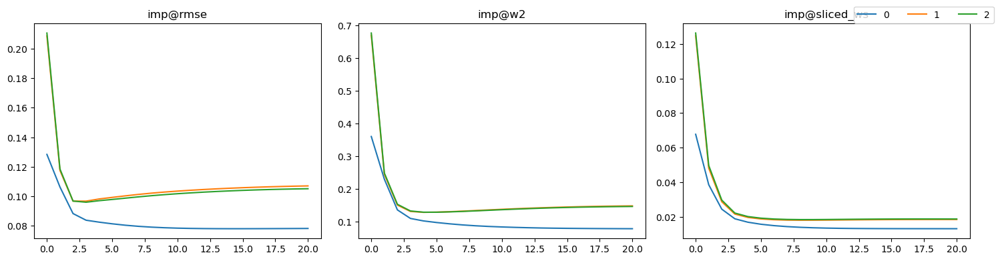

2023-10-12 12:10:45.558 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6655, test_f1: 0.0000 test_auroc: 0.7279 test_auprc: 0.5747 train_loss: 0.6594 val_accu: 0.6650 val_f1: 0.3994


{'imp@rmse': 0.09653119792151996, 'imp@ws': 0.12367320028717038, 'imp@sliced_ws': 0.016806663789166308}


2023-10-12 12:10:56.081 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.9195, test_f1: 0.8766 test_auroc: 0.9727 test_auprc: 0.9476 train_loss: 0.3769 val_accu: 0.8306 val_f1: 0.7996
2023-10-12 12:11:06.554 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.8825, test_f1: 0.8268 test_auroc: 0.9484 test_auprc: 0.9112 train_loss: 0.3586 val_accu: 0.8381 val_f1: 0.8125
2023-10-12 12:11:16.807 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.8685, test_f1: 0.8065 test_auroc: 0.9360 test_auprc: 0.8936 train_loss: 0.3506 val_accu: 0.8447 val_f1: 0.8163
2023-10-12 12:11:27.176 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.8635, test_f1: 0.8000 test_auroc: 0.9325 test_auprc: 0.8879 train_loss: 0.3465 val_accu: 0.8436 val_f1: 0.8161


0.946 0.9207048458149779 0.9829039383944325 0.9597879726795361


In [32]:
name = 'mnar_lr_codrna_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary split

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-12 12:15:32.627 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:15:32.628 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:16:05.265 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:16:05.266 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:16:41.041 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:16:41.042 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:16:44.619 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 75.1478586000012


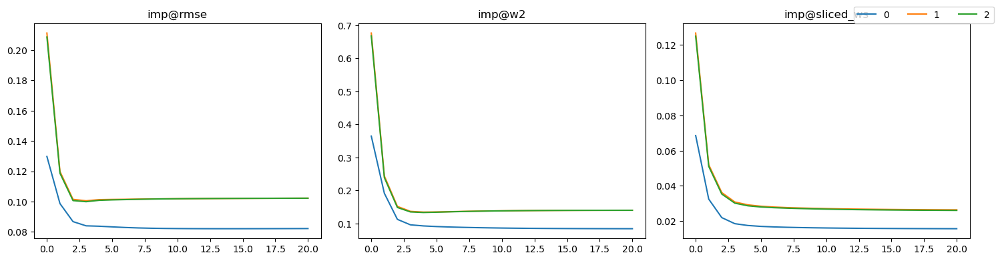

{'imp@rmse': 0.09548530116404749, 'imp@ws': 0.12105595463901685, 'imp@sliced_ws': 0.022810886322570792}


2023-10-12 12:16:45.212 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6685, test_f1: 0.0000 test_auroc: 0.7708 test_auprc: 0.6307 train_loss: 0.6577 val_accu: 0.6683 val_f1: 0.4006
2023-10-12 12:16:55.364 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.9140, test_f1: 0.8759 test_auroc: 0.9699 test_auprc: 0.9390 train_loss: 0.3720 val_accu: 0.8094 val_f1: 0.7889
2023-10-12 12:17:05.462 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.8805, test_f1: 0.8262 test_auroc: 0.9406 test_auprc: 0.8856 train_loss: 0.3498 val_accu: 0.8328 val_f1: 0.8005
2023-10-12 12:17:15.616 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.8545, test_f1: 0.7920 test_auroc: 0.9225 test_auprc: 0.8531 train_loss: 0.3404 val_accu: 0.8367 val_f1: 0.8082
2023-1

0.9325 0.8968678380443087 0.9799465497032482 0.9553125112605841


In [33]:
name = 'mnar_lr_codrna_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 1.0,
    "gamma": 0.1,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

#### Split gamma tune

In [34]:
%matplotlib inline
results_gamma = []
for gamma in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 3
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
    config2['data_partition']['strategy'] = 'sample-evenly'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 1.0,
        "gamma": gamma,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = False)
    results_gamma.append(ret.copy())

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:17:49.823 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:17:49.823 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:18:22.051 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:18:22.051 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:18:57.816 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:18:57.816 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:19:01.383 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.64581049999106


{'imp@rmse': 0.09515416047766503, 'imp@ws': 0.1241573962686005, 'imp@sliced_ws': 0.017086318760326326}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:19:14.969 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:19:14.970 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:19:47.137 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:19:47.138 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:20:22.825 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:20:22.826 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:20:26.426 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.54375959999743


{'imp@rmse': 0.09477985483157197, 'imp@ws': 0.1204681670711928, 'imp@sliced_ws': 0.023196912584539243}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:20:40.107 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:20:40.108 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:21:12.406 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:21:12.407 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:21:48.337 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:21:48.338 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:21:51.980 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.9877264000097


{'imp@rmse': 0.10178347982519405, 'imp@ws': 0.13703176686807142, 'imp@sliced_ws': 0.03191925653709801}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:22:05.639 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:22:05.639 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:22:37.668 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:22:37.669 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:23:13.279 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:23:13.279 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:23:16.848 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.30470560000686


{'imp@rmse': 0.14186254665903594, 'imp@ws': 0.27106526392713504, 'imp@sliced_ws': 0.05962835518213821}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:23:30.543 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:23:30.544 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:24:02.582 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:24:02.583 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:24:38.184 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:24:38.185 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:24:41.780 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.33879740000702


{'imp@rmse': 0.14569759890542747, 'imp@ws': 0.2966462936563245, 'imp@sliced_ws': 0.06364570233520912}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:24:55.464 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:24:55.465 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:25:27.367 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:25:27.368 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:26:03.033 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:26:03.033 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:26:06.613 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.2499908000027


{'imp@rmse': 0.15677035267447378, 'imp@ws': 0.34653088997588793, 'imp@sliced_ws': 0.07303479773570412}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:26:20.239 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:26:20.239 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:26:52.161 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:26:52.162 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:27:27.863 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:27:27.864 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:27:31.492 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.35206850001123


{'imp@rmse': 0.16362958927187587, 'imp@ws': 0.3881547815292186, 'imp@sliced_ws': 0.07783670747477937}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:27:45.193 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:27:45.193 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:28:17.033 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:28:17.033 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:28:52.520 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:28:52.520 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:28:56.096 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.02167119999649


{'imp@rmse': 0.18525072236673837, 'imp@ws': 0.48023663716326936, 'imp@sliced_ws': 0.09257272390017304}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:29:09.775 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:29:09.775 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:29:41.726 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:29:41.726 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:30:17.111 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:30:17.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:30:20.684 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.02219659999537


{'imp@rmse': 0.21513353277732086, 'imp@ws': 0.6687612054287501, 'imp@sliced_ws': 0.1106212599426119}


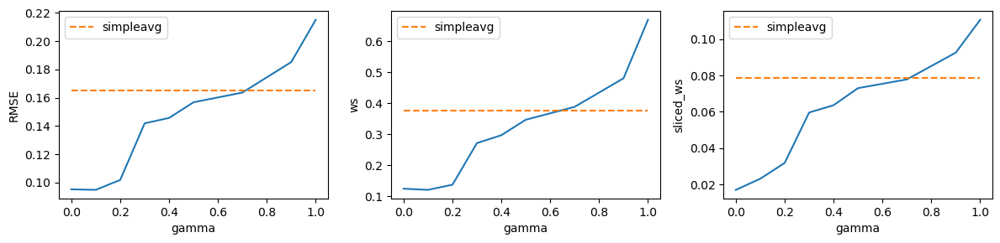

In [35]:
x = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_gamma]
y_ws = [r['imp_result']['imp@ws'] for r in results_gamma]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_gamma]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('gamma')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.16510957775813623
ws = 0.37504788621548235
sliced_ws = 0.07883442302246715
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()



#### split tune alpha

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:30:34.560 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:30:34.560 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:31:06.513 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:31:06.514 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:31:41.669 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:31:41.670 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:31:45.191 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.72757719999936


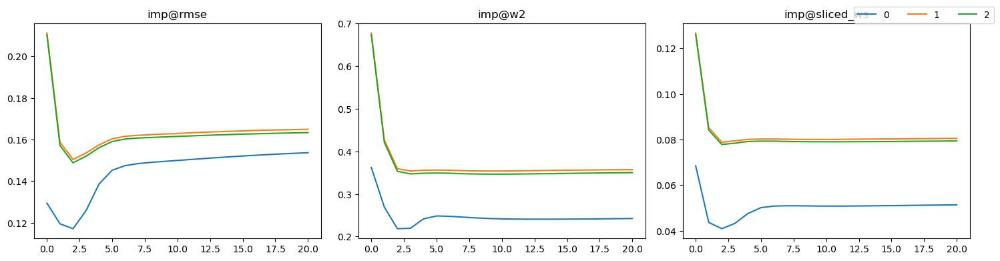

{'imp@rmse': 0.16029562400560687, 'imp@ws': 0.3160606605266915, 'imp@sliced_ws': 0.07031598303981922}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:31:58.861 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:31:58.862 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:32:30.490 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:32:30.490 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:33:05.727 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:33:05.727 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:33:09.279 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.46278999999049


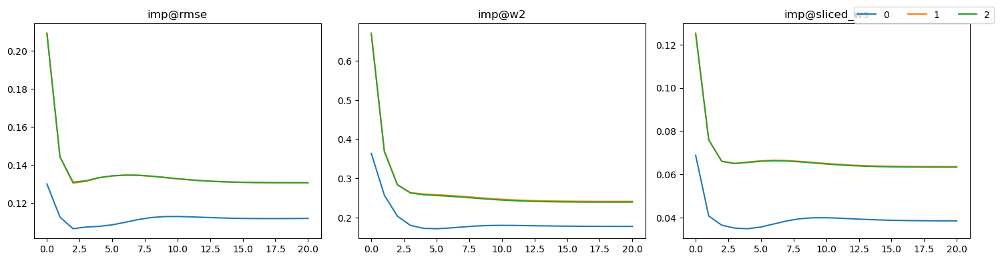

{'imp@rmse': 0.12427137471691262, 'imp@ws': 0.21915725155946636, 'imp@sliced_ws': 0.05508439055195449}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:33:23.003 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:33:23.003 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:33:54.666 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:33:54.667 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:34:29.851 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:34:29.852 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:34:33.397 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.42996259999927


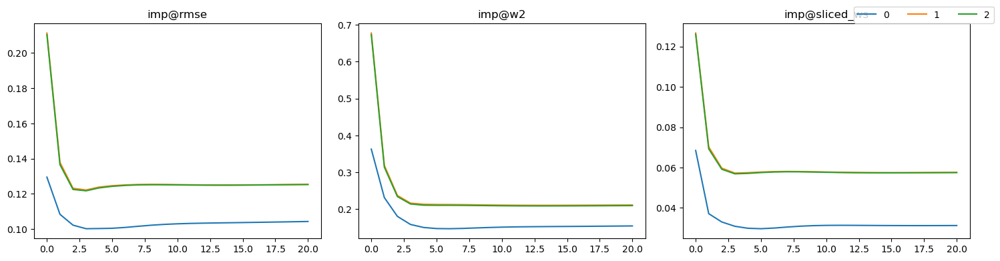

{'imp@rmse': 0.11815212482242211, 'imp@ws': 0.19032960991138195, 'imp@sliced_ws': 0.04874113838687798}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:34:47.129 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:34:47.130 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:35:18.828 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:35:18.828 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:35:54.009 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:35:54.009 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:35:57.556 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.4822365


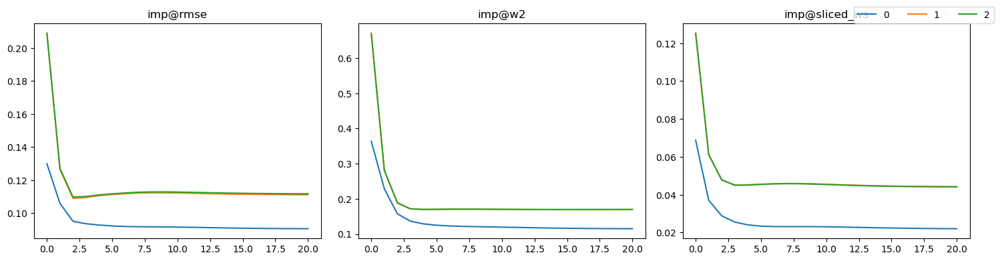

{'imp@rmse': 0.10443399122105813, 'imp@ws': 0.15143772761652247, 'imp@sliced_ws': 0.03691955875018914}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:36:11.260 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:36:11.261 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:36:42.761 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:36:42.761 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:37:17.831 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:37:17.832 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:37:21.353 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.14580859999114


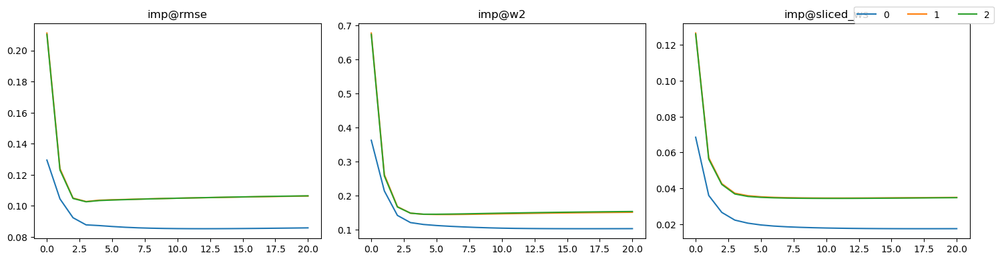

{'imp@rmse': 0.09934926752061919, 'imp@ws': 0.1344133442233844, 'imp@sliced_ws': 0.028934466829621912}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:37:35.092 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:37:35.092 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:38:06.749 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:38:06.750 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:38:42.195 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:38:42.196 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:38:45.735 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.69707000000926


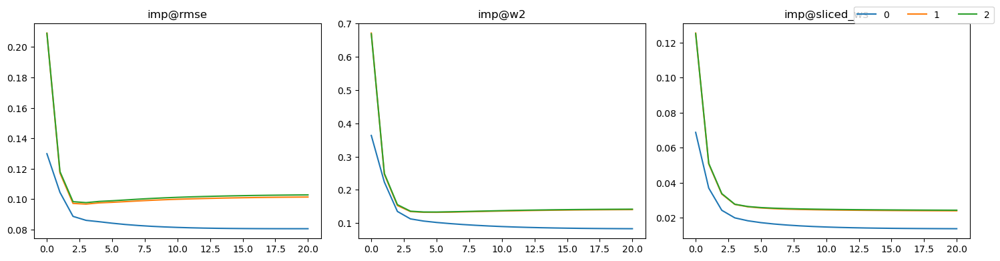

{'imp@rmse': 0.09486163645604201, 'imp@ws': 0.1218738103296372, 'imp@sliced_ws': 0.020794297080641178}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:38:59.663 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:38:59.663 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:39:31.254 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:39:31.254 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:40:06.329 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:40:06.330 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:40:09.841 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.21374469999864


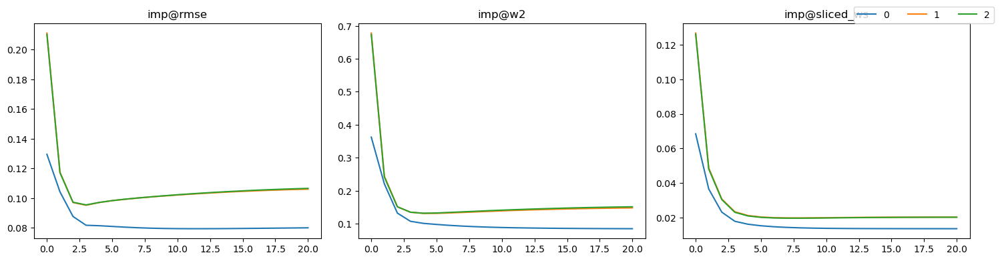

{'imp@rmse': 0.09708058849915721, 'imp@ws': 0.12713152084809762, 'imp@sliced_ws': 0.018161303899366227}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:40:23.514 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:40:23.514 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:40:55.123 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:40:55.123 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:41:30.392 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:41:30.393 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:41:33.933 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.45987829999649


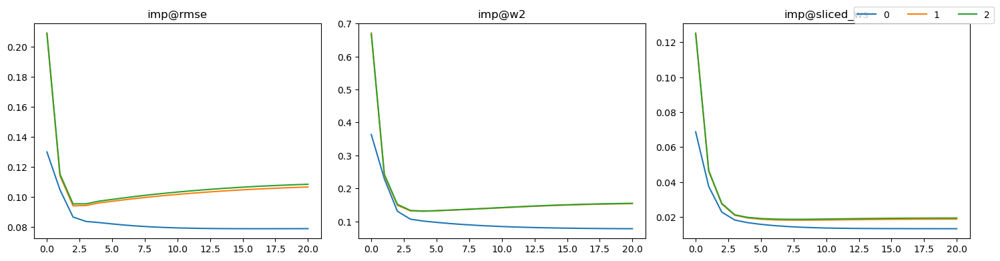

{'imp@rmse': 0.0973753208631425, 'imp@ws': 0.1281232080873896, 'imp@sliced_ws': 0.017073392548493795}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:41:47.635 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:41:47.636 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:42:19.326 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:42:19.327 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:42:54.423 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:42:54.423 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:42:57.968 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.38546360000328


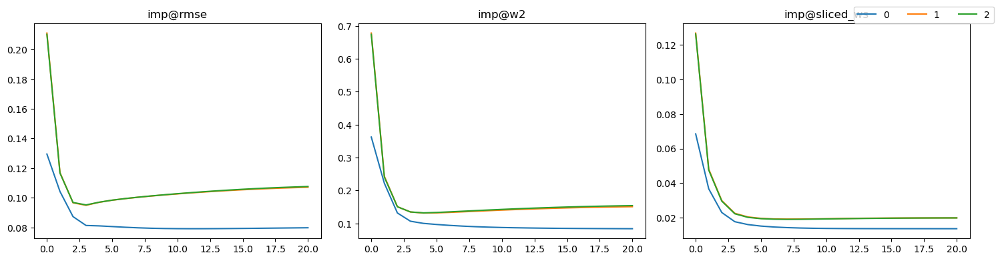

{'imp@rmse': 0.09766080163610527, 'imp@ws': 0.1288984528458317, 'imp@sliced_ws': 0.017880716298190765}


In [36]:
%matplotlib inline
results_alpha = []
for alpha in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 3
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
    config2['data_partition']['strategy'] = 'sample-evenly'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": alpha,
        "gamma": 0.0,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_alpha.append(ret.copy())

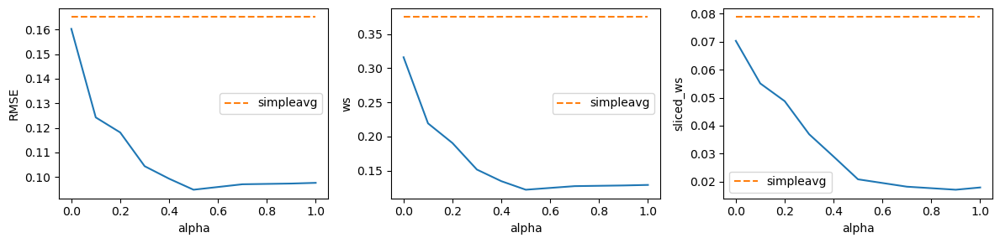

In [37]:
x = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_alpha]
y_ws = [r['imp_result']['imp@ws'] for r in results_alpha]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_alpha]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('alpha')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.16510957775813623
ws = 0.37504788621548235
sliced_ws = 0.07883442302246715
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()

plt.tight_layout()
plt.show()


#### Split tune scale

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:43:11.870 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:43:11.871 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:43:43.433 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:43:43.434 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:44:18.469 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:44:18.470 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:44:21.998 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.18039489998773


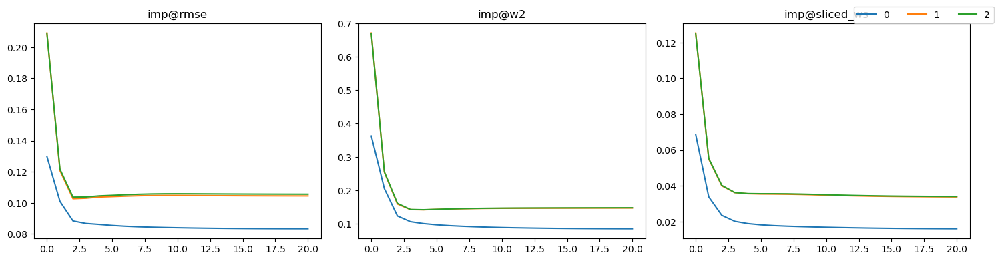

{'imp@rmse': 0.0978066856356989, 'imp@ws': 0.1274444510665494, 'imp@sliced_ws': 0.027944051298857533}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:44:35.728 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:44:35.729 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:45:07.283 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:45:07.283 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:45:42.320 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:45:42.321 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:45:45.865 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.18000709998887


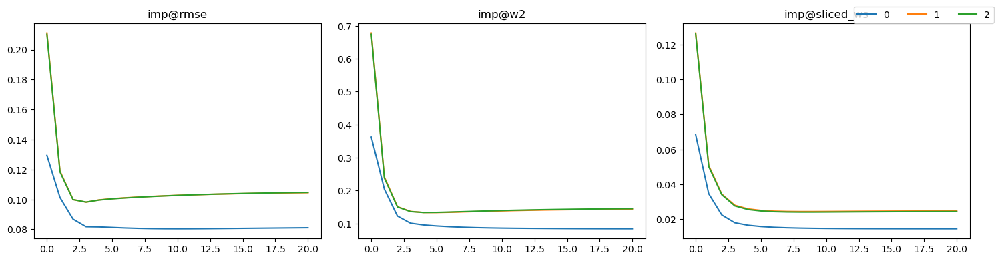

{'imp@rmse': 0.09656697528897394, 'imp@ws': 0.12363298965162402, 'imp@sliced_ws': 0.02128053947622845}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:45:59.616 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:45:59.616 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:46:31.273 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:46:31.274 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:47:06.613 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:47:06.614 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:47:10.428 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 73.83688709999842


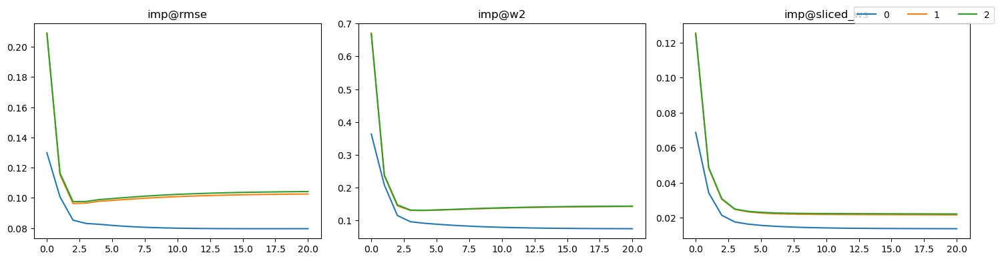

{'imp@rmse': 0.09531340147842927, 'imp@ws': 0.12024300234152413, 'imp@sliced_ws': 0.01927546139095227}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-12 12:47:24.457 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:47:24.457 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:47:56.672 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:47:56.673 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:48:32.267 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:48:32.268 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:48:35.853 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 74.5066594999953


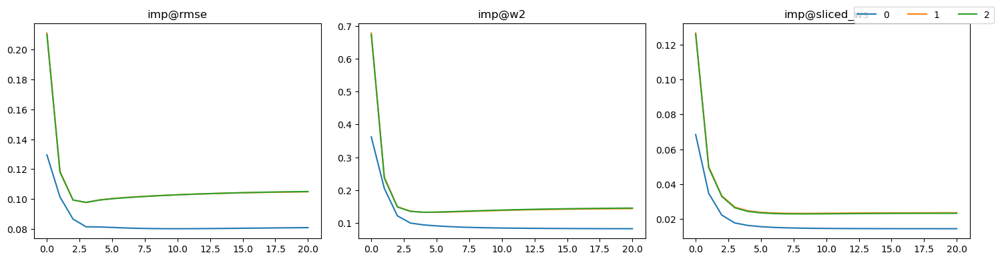

{'imp@rmse': 0.09661553362541281, 'imp@ws': 0.12391040695551093, 'imp@sliced_ws': 0.020519005251940784}


In [38]:
%matplotlib inline
results_scale = []
for scale in [1, 2, 3, 4]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 3
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
    config2['data_partition']['strategy'] = 'sample-evenly'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 0.9,
        "gamma": 0.05,
        "client_thres": 1.0,
        "scale_factor": scale
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_scale.append(ret.copy())

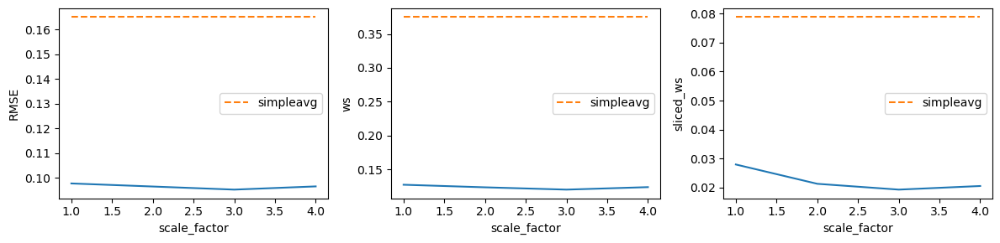

In [39]:
x = [1, 2, 3, 4]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_scale]
y_ws = [r['imp_result']['imp@ws'] for r in results_scale]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_scale]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('scale_factor')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.16510957775813623
ws = 0.37504788621548235
sliced_ws = 0.07883442302246715
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()

plt.tight_layout()
plt.show()


## Clients MNAR 10 clients no complementary

### Simple average

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-12 12:48:49.409 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:48:49.411 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:49:18.278 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:49:18.278 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:49:50.368 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:49:50.368 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:49:53.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.72163430000364


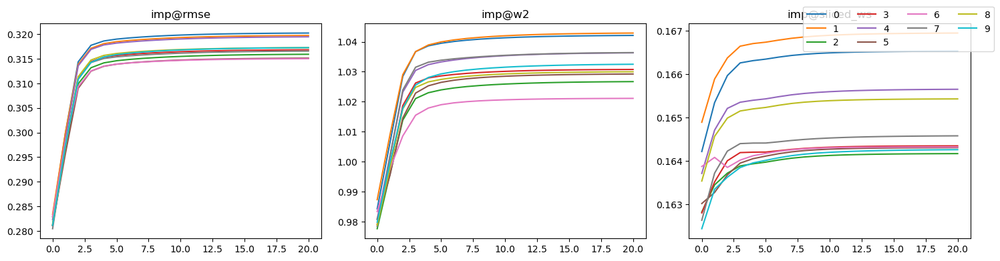

2023-10-12 12:49:54.030 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6720, test_f1: 0.0000 test_auroc: 0.7964 test_auprc: 0.6152 train_loss: 0.6616 val_accu: 0.6722 val_f1: 0.4020


{'imp@rmse': 0.31724148632788224, 'imp@ws': 1.0327202461435718, 'imp@sliced_ws': 0.1650482253637849}


2023-10-12 12:50:04.207 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.4615, test_f1: 0.3828 test_auroc: 0.5037 test_auprc: 0.4993 train_loss: 0.5125 val_accu: 0.7656 val_f1: 0.6696
2023-10-12 12:50:14.584 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.3220, test_f1: 0.4264 test_auroc: 0.4113 test_auprc: 0.2924 train_loss: 0.4492 val_accu: 0.8014 val_f1: 0.7389
2023-10-12 12:50:25.000 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.3220, test_f1: 0.4293 test_auroc: 0.4084 test_auprc: 0.2896 train_loss: 0.4479 val_accu: 0.8072 val_f1: 0.7532
2023-10-12 12:50:35.259 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.3120, test_f1: 0.4209 test_auroc: 0.4022 test_auprc: 0.2876 train_loss: 0.4410 val_accu: 0.8083 val_f1: 0.7546


0.711 0.45676691729323304 0.8131306257259001 0.6151660641637402


In [40]:
name = 'mnar_lr_codrna_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 9)


2023-10-12 12:50:58.710 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:50:58.711 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-12 12:51:27.699 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:51:27.700 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-12 12:51:59.828 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-12 12:51:59.829 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-12 12:52:03.095 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.90603429998737


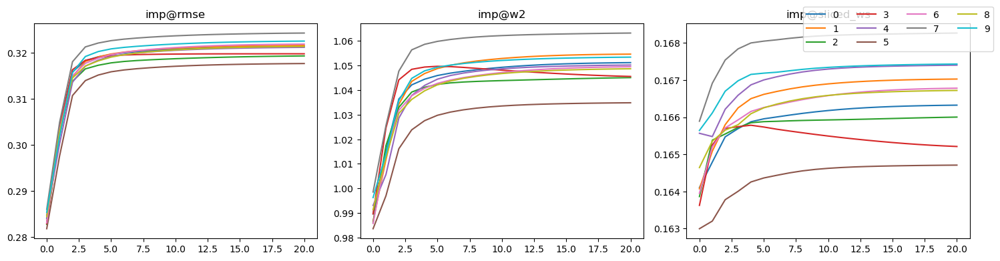

2023-10-12 12:52:03.526 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.6685, test_f1: 0.0000 test_auroc: 0.7770 test_auprc: 0.6000 train_loss: 0.6626 val_accu: 0.6694 val_f1: 0.4010


{'imp@rmse': 0.32108221061148867, 'imp@ws': 1.0495496076525759, 'imp@sliced_ws': 0.16658073680649604}


2023-10-12 12:52:13.912 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 100, test_accu: 0.4350, test_f1: 0.3430 test_auroc: 0.3934 test_auprc: 0.3176 train_loss: 0.5014 val_accu: 0.7739 val_f1: 0.6868
2023-10-12 12:52:24.251 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 200, test_accu: 0.2620, test_f1: 0.3740 test_auroc: 0.3831 test_auprc: 0.2975 train_loss: 0.4710 val_accu: 0.7881 val_f1: 0.7204
2023-10-12 12:52:34.763 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 300, test_accu: 0.2800, test_f1: 0.3872 test_auroc: 0.3962 test_auprc: 0.3014 train_loss: 0.4625 val_accu: 0.7942 val_f1: 0.7269
2023-10-12 12:52:45.220 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 400, test_accu: 0.3105, test_f1: 0.3949 test_auroc: 0.4220 test_auprc: 0.3087 train_loss: 0.4685 val_accu: 0.7925 val_f1: 0.7207


0.704 0.4253666954270923 0.8219438399604707 0.6709654928817823


In [41]:
name = 'mnar_lr_codrna_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codrna'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

### Complementary Split

#### Tune Gamma

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:07:07.056 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:07:07.057 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:07:39.786 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:07:39.787 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:08:12.327 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:08:12.327 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:08:15.620 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 71.11133710001013


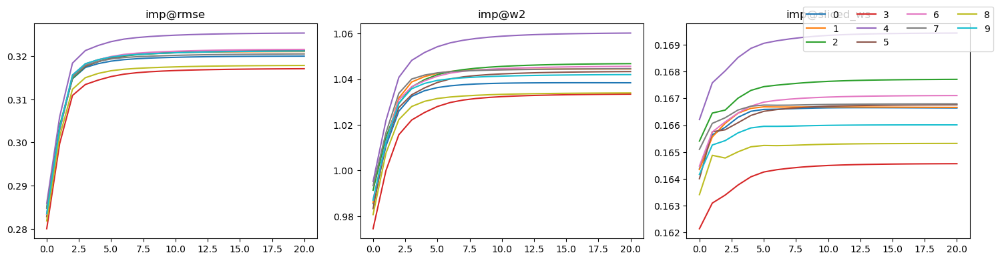

{'imp@rmse': 0.3206578172668318, 'imp@ws': 1.0431968988424887, 'imp@sliced_ws': 0.1666991671277634}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:08:29.316 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:08:29.317 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:08:59.478 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:08:59.478 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:09:33.183 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:09:33.184 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:09:36.554 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 69.80030150001403


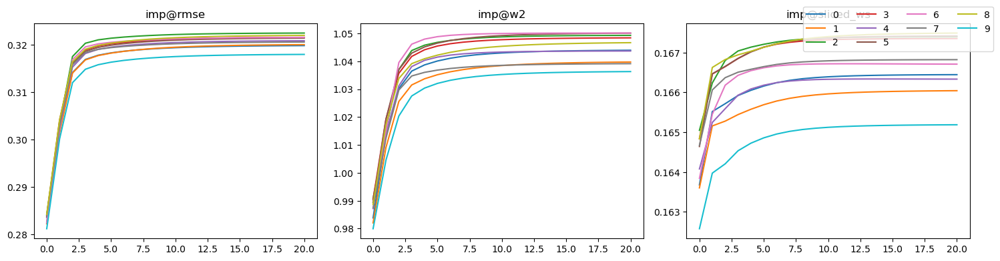

{'imp@rmse': 0.3207976696519386, 'imp@ws': 1.0446664486543242, 'imp@sliced_ws': 0.166715742686813}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:09:50.710 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:09:50.711 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:10:21.018 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:10:21.019 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:10:54.645 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:10:54.645 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:10:58.000 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 70.08199650002643


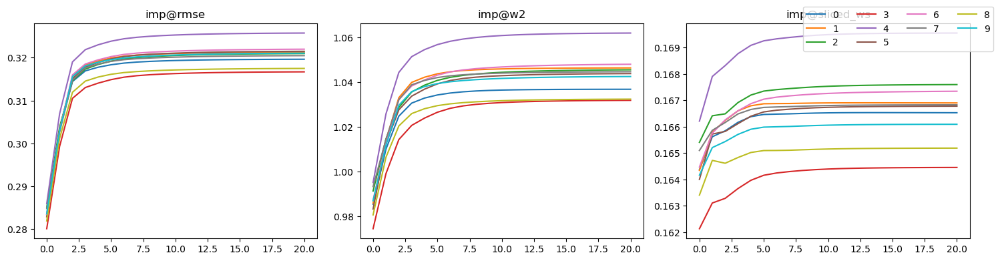

{'imp@rmse': 0.32066471555167475, 'imp@ws': 1.0433018641810552, 'imp@sliced_ws': 0.16672255229223332}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:11:11.858 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:11:11.858 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:11:42.174 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:11:42.175 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:12:14.383 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:12:14.384 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:12:17.589 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 68.33111090000602


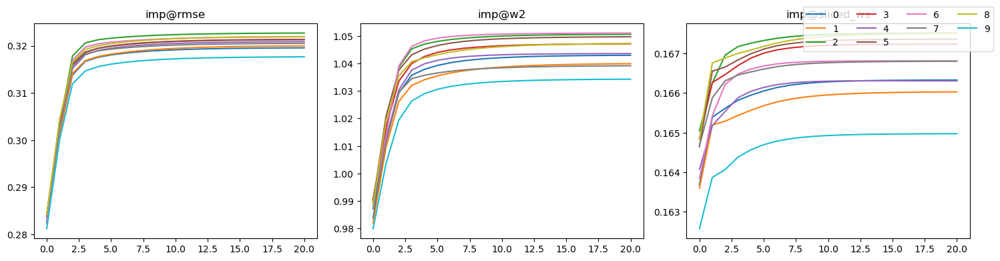

{'imp@rmse': 0.3207447667348006, 'imp@ws': 1.0444915606527359, 'imp@sliced_ws': 0.16668040224005737}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:12:30.896 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:12:30.896 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:12:59.777 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:12:59.777 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:13:32.395 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:13:32.396 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:13:35.674 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 67.2837806000025


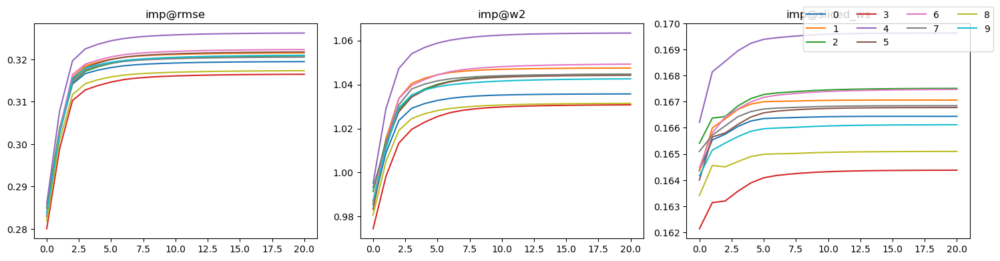

{'imp@rmse': 0.3206655415637054, 'imp@ws': 1.0433300650952468, 'imp@sliced_ws': 0.16672932431408594}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:13:49.077 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:13:49.077 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:14:18.176 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:14:18.177 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:14:50.476 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:14:50.477 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:14:53.738 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 67.17492239997955


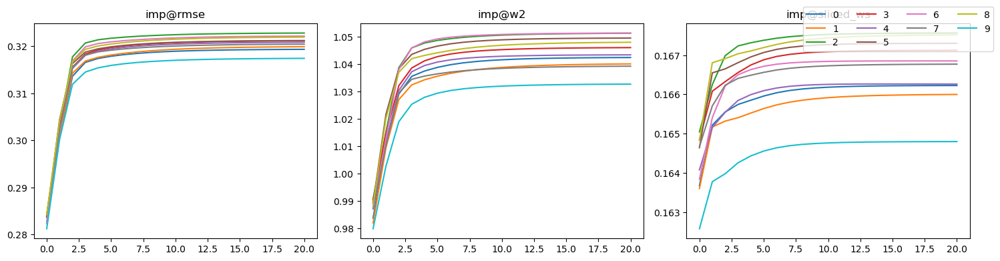

{'imp@rmse': 0.3206759521929709, 'imp@ws': 1.0442577106070063, 'imp@sliced_ws': 0.16664100694055775}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:15:07.157 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:15:07.157 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:15:36.165 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:15:36.165 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:16:08.185 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:16:08.185 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:16:11.390 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.75180570001248


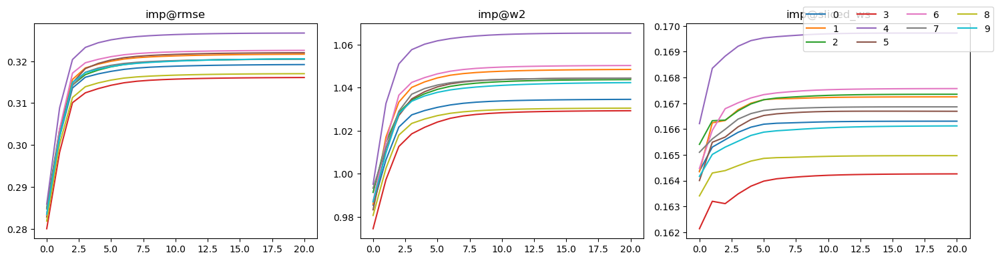

{'imp@rmse': 0.32065098808844156, 'imp@ws': 1.043261716762577, 'imp@sliced_ws': 0.166707229936771}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:16:24.690 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:16:24.690 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:16:53.351 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:16:53.352 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:17:25.193 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:17:25.194 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:17:28.422 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.19962180001312


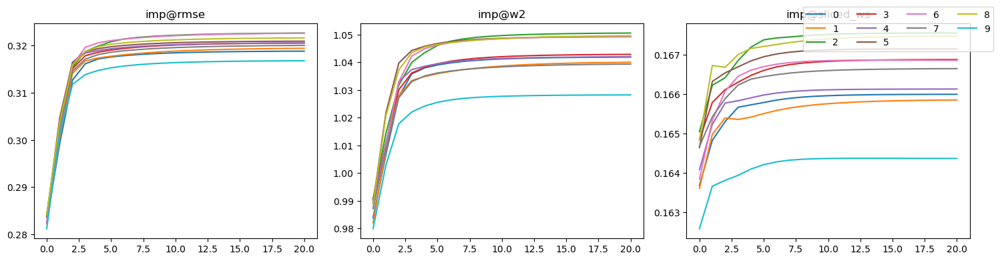

{'imp@rmse': 0.32037644349462596, 'imp@ws': 1.0432731017727974, 'imp@sliced_ws': 0.16649258148997295}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:17:41.745 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:17:41.746 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:18:10.435 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:18:10.435 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:18:42.194 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:18:42.194 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:18:45.407 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.15414620001684


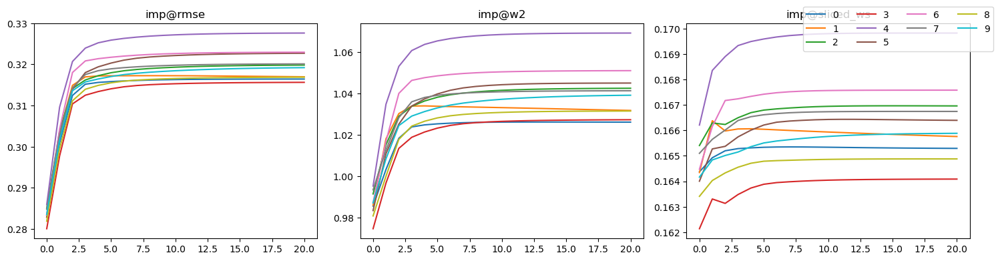

{'imp@rmse': 0.3198210402508817, 'imp@ws': 1.0405238946426103, 'imp@sliced_ws': 0.16634477438802597}


In [48]:
%matplotlib inline
results = []
for gamma in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": 0.9,
        "gamma": gamma,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results.append(ret.copy())

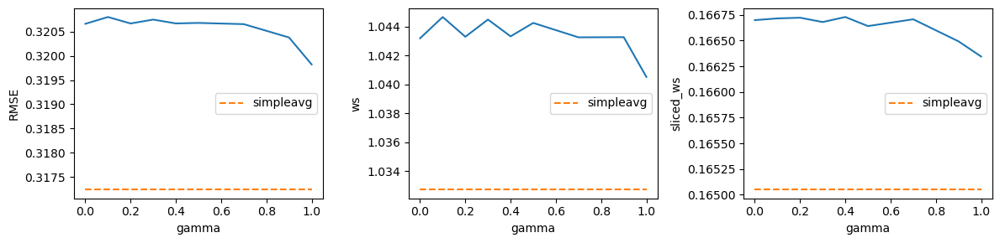

In [49]:
x = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.9, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results]
y_ws = [r['imp_result']['imp@ws'] for r in results]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('gamma')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.31724148632788224
ws = 1.0327202461435718
sliced_ws = 0.1650482253637849
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

#### Tune alpha

m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:26:04.838 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:26:04.838 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:26:36.610 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:26:36.611 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:27:08.408 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:27:08.409 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:27:11.617 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 69.29460609998205


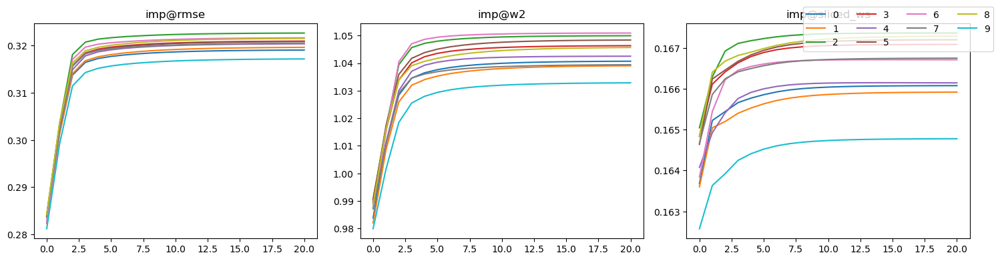

{'imp@rmse': 0.3204020781909393, 'imp@ws': 1.0435120616298286, 'imp@sliced_ws': 0.1665304356393326}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:27:24.790 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:27:24.791 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:27:53.420 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:27:53.421 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:28:25.109 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:28:25.110 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:28:28.300 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 65.98828449999564


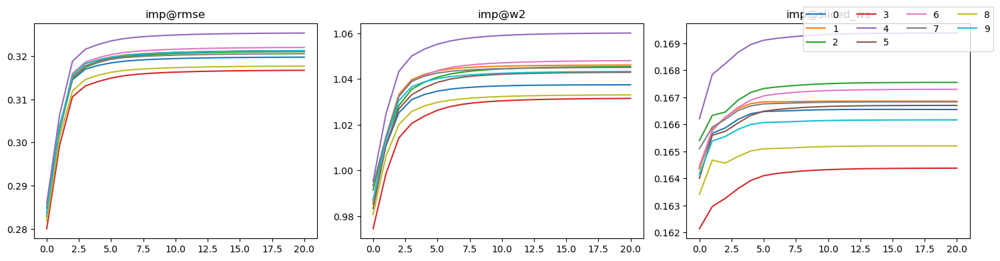

{'imp@rmse': 0.3206238696443153, 'imp@ws': 1.0432123632933539, 'imp@sliced_ws': 0.166692897085404}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:28:41.815 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:28:41.816 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:29:10.426 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:29:10.427 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:29:42.327 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:29:42.327 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:29:45.528 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.18244379997486


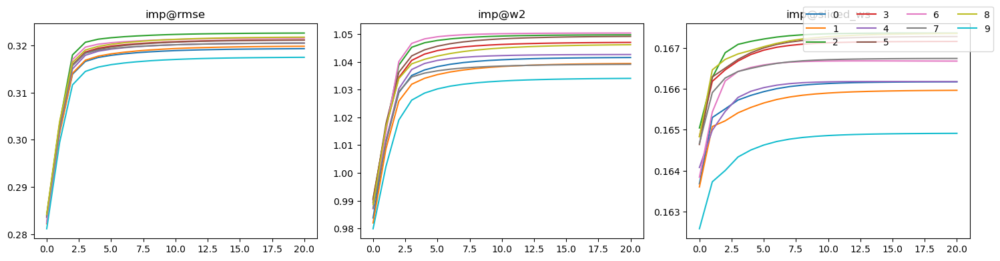

{'imp@rmse': 0.3205116431191962, 'imp@ws': 1.0438534738679082, 'imp@sliced_ws': 0.16658492290491267}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:29:58.670 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:29:58.671 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:30:27.324 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:30:27.325 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:30:59.171 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:30:59.171 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:31:02.392 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.18027199999779


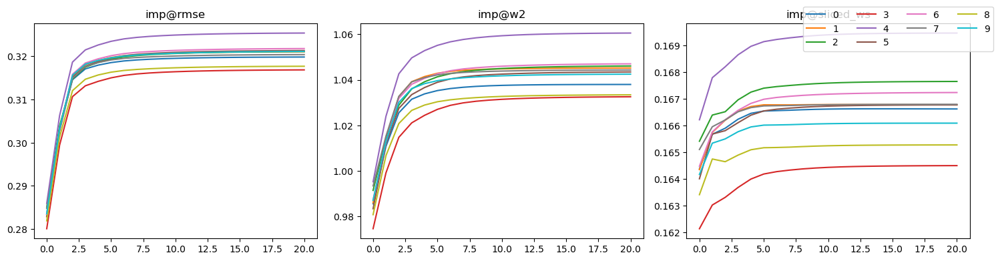

{'imp@rmse': 0.3206324620842138, 'imp@ws': 1.0432336599215402, 'imp@sliced_ws': 0.1667084549568766}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:31:15.509 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:31:15.510 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:31:44.271 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:31:44.272 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:32:16.130 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:32:16.130 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:32:19.342 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 66.30194090001169


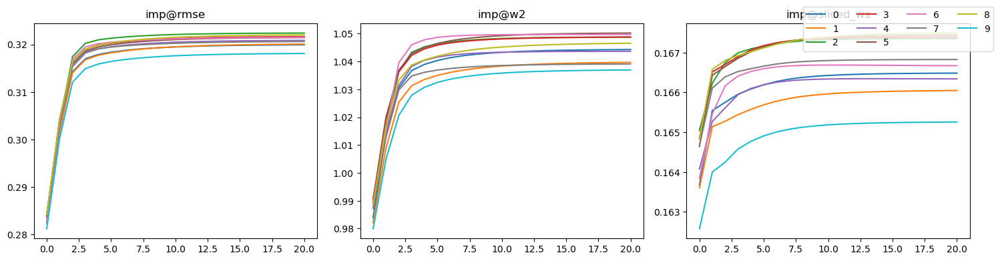

{'imp@rmse': 0.3208109329772263, 'imp@ws': 1.0447094347155197, 'imp@sliced_ws': 0.16672546040375977}


m:\miniconda3\envs\fed_imp\lib\site-packages\dython\nominal.py:293: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(


(18000, 9) (2000, 9)
(18000, 9)
sample-evenly {}
['mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']


2023-10-13 11:32:32.479 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:32:32.479 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-10-13 11:33:01.069 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:33:01.070 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-10-13 11:33:32.784 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-10-13 11:33:32.785 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-10-13 11:33:35.987 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 65.97772680001799


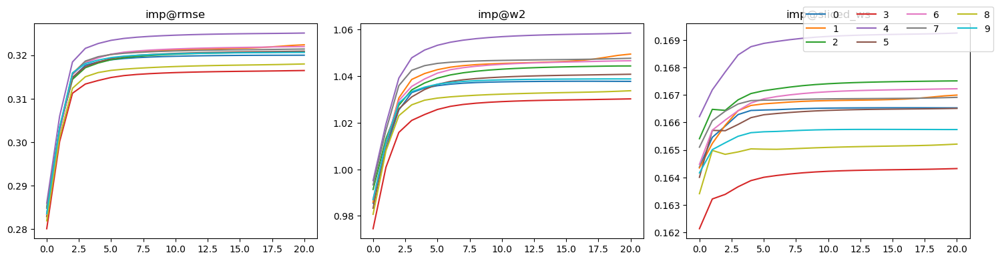

{'imp@rmse': 0.3206468066190184, 'imp@ws': 1.042475250811187, 'imp@sliced_ws': 0.1665965121005226}


In [50]:
%matplotlib inline
results_alpha2 = []
for alpha in [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    config2 = experiment_config_template.copy()
    config2['data']['dataset_name'] = 'codrna'
    config2['num_clients'] = 10
    config2['missing_simulate']['mr_strategy'] = mr_strategy
    config2['missing_simulate']['mf_strategy'] = 'all'
    config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.0'

    config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
    config2["algo_params"]["fedmechw_new"] = {
        "alpha": alpha,
        "gamma": 0.05,
        "client_thres": 1.0,
        "scale_factor": 4
    }

    config2['server_type'] = 'fedavg_pytorch'
    config2['prediction'] = False
    config2['save_state'] = True
    config2['track'] = True

    clients, test_data, new_seed = simulate_scenario(config2)
    server, ret = run_simulation(config2, clients, test_data, new_seed, vis = True)
    results_alpha2.append(ret.copy())

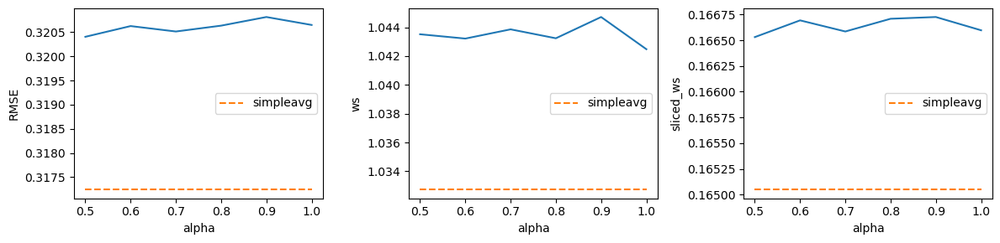

In [51]:
x = [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
y_rmse = [r['imp_result']['imp@rmse'] for r in results_alpha2]
y_ws = [r['imp_result']['imp@ws'] for r in results_alpha2]
y_sliced_ws = [r['imp_result']['imp@sliced_ws'] for r in results_alpha2]

fig, ax = plt.subplots(1, 3, figsize=(12, 3))

for i in range(3):
    ax[i].set_xlabel('alpha')

ax[0].plot(x, y_rmse)
ax[0].set_ylabel('RMSE')
ax[1].plot(x, y_ws)
ax[1].set_ylabel('ws')
ax[2].plot(x, y_sliced_ws)
ax[2].set_ylabel('sliced_ws')

rmse = 0.31724148632788224
ws = 1.0327202461435718
sliced_ws = 0.1650482253637849
ax[0].plot(x, [rmse] * len(x), '--', label = 'simpleavg')
ax[1].plot(x, [ws] * len(x), '--', label = 'simpleavg')
ax[2].plot(x, [sliced_ws] * len(x), '--', label = 'simpleavg')

ax[0].legend()
ax[1].legend()
ax[2].legend()
plt.tight_layout()
plt.show()

# Codon

In [12]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

### MNAR Clients LR

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-08-02 08:30:46.644 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:30:46.646 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-02 08:31:55.637 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:31:55.638 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-02 08:33:09.489 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:33:09.489 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-02 08:33:16.462 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 152.67422590003116


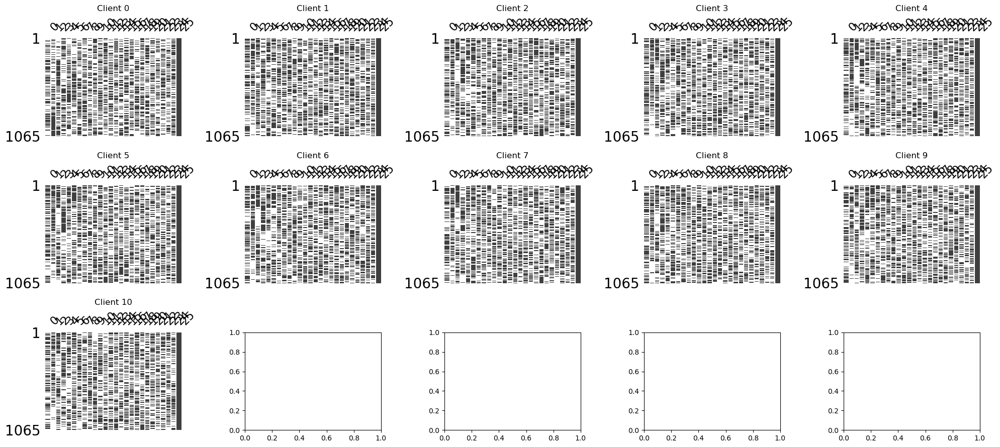

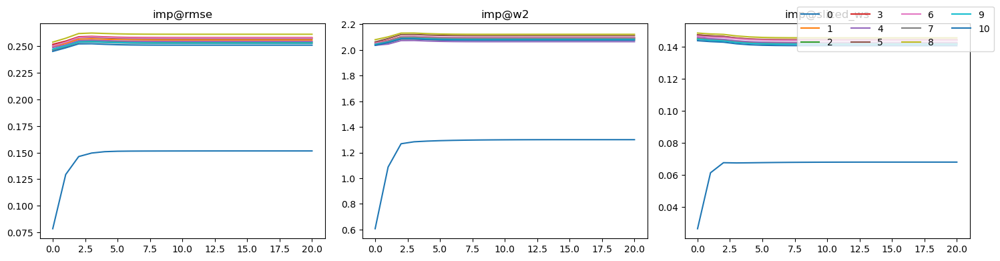

{'imp@rmse': 0.24613234782972357, 'imp@ws': 2.01805463508386, 'imp@sliced_ws': 0.13616762138704153}


2023-08-02 08:33:20.021 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 0, test_accu: 0.2183, test_f1: 0.0806 test_auroc: 0.7852 train_loss: 2.0358 val_accu: 0.2207 val_f1: 0.0404
2023-08-02 08:33:46.392 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 100, test_accu: 0.6826, test_f1: 0.6465 test_auroc: 0.9507 train_loss: 1.2545 val_accu: 0.5625 val_f1: 0.3224
2023-08-02 08:34:12.541 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 200, test_accu: 0.6879, test_f1: 0.6621 test_auroc: 0.9545 train_loss: 1.1059 val_accu: 0.5971 val_f1: 0.3668
2023-08-02 08:34:37.638 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 300, test_accu: 0.6749, test_f1: 0.6480 test_auroc: 0.9501 train_loss: 1.0417 val_accu: 0.6214 val_f1: 0.3882
2023-08-02 08:35:03.689 | INFO     | src.fed_imp.sub_modules.server.pred_server_ce

0.7002305918524212 0.9573200588259659 0.6705442531540108


In [15]:
name = 'mnar_lr_codon_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-08-02 08:41:54.816 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:41:54.817 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-02 08:43:06.498 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:43:06.499 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-02 08:44:18.778 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-02 08:44:18.779 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-02 08:44:26.144 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 154.13708709995262


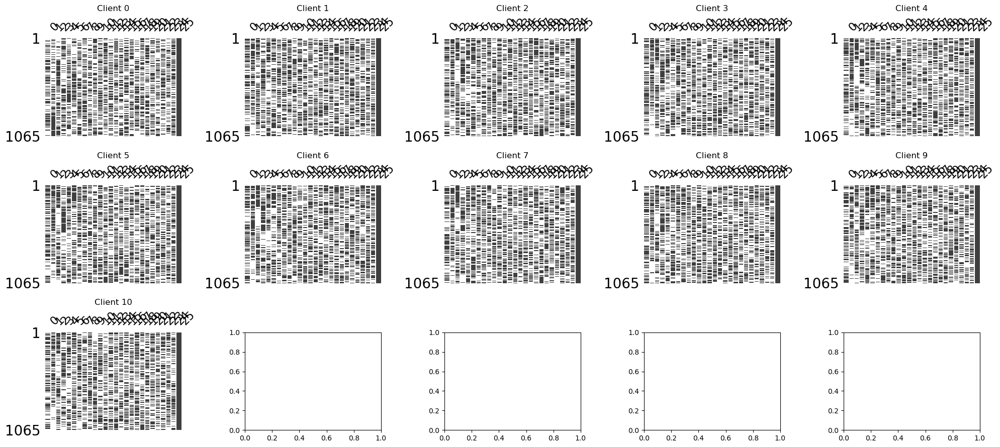

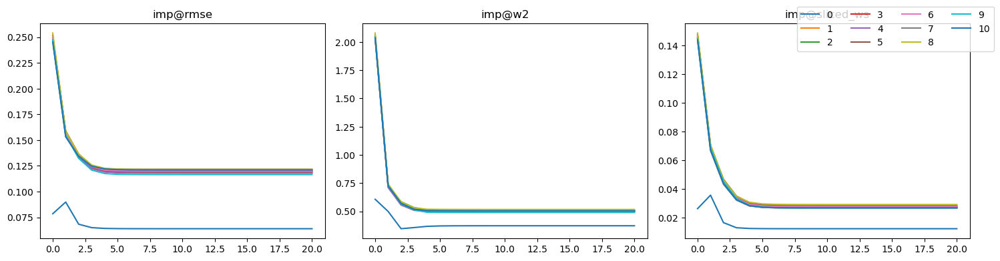

{'imp@rmse': 0.11453043431897561, 'imp@ws': 0.48896923900419104, 'imp@sliced_ws': 0.026248099440013356}


2023-08-02 08:44:29.890 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 0, test_accu: 0.3989, test_f1: 0.2708 test_auroc: 0.8347 train_loss: 2.0237 val_accu: 0.3824 val_f1: 0.1170
2023-08-02 08:44:55.494 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 100, test_accu: 0.8540, test_f1: 0.8440 test_auroc: 0.9889 train_loss: 0.4005 val_accu: 0.8451 val_f1: 0.6733
2023-08-02 08:45:21.018 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 200, test_accu: 0.8601, test_f1: 0.8507 test_auroc: 0.9899 train_loss: 0.3483 val_accu: 0.8592 val_f1: 0.7112
2023-08-02 08:45:47.358 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:169 - Round: 300, test_accu: 0.8640, test_f1: 0.8559 test_auroc: 0.9901 train_loss: 0.3257 val_accu: 0.8609 val_f1: 0.7059
2023-08-02 08:46:13.161 | INFO     | src.fed_imp.sub_modules.server.pred_server_ce

0.8731744811683321 0.9904368089900297 0.8678631432986038


In [16]:
name = 'mnar_lr_codon_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

pred_ret = NN_evaluation(
    rets[name], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

# Diabetic

## MNAR LR Balanced

(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 15:54:00.938 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:54:00.938 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 15:55:02.832 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:55:02.833 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 15:56:06.091 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 15:56:06.091 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 15:56:12.461 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 133.00582120000036


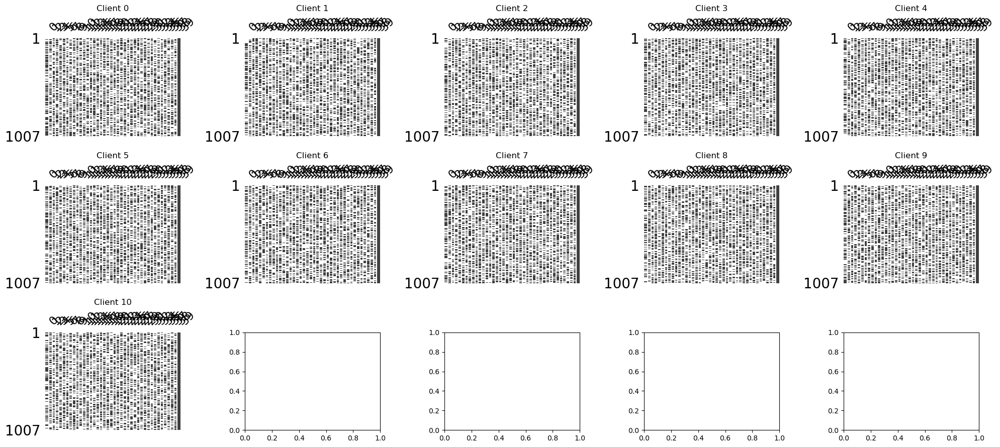

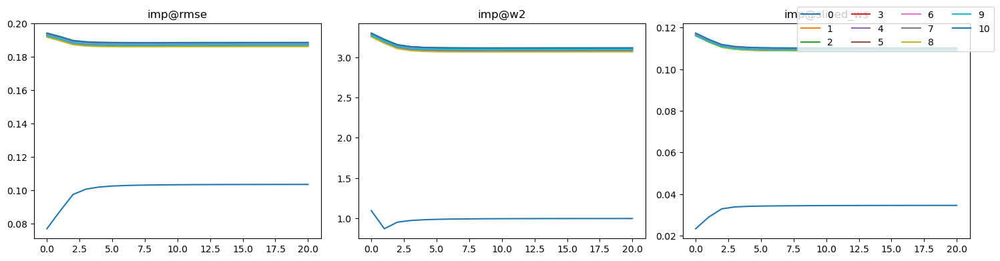

{'imp@rmse': 0.1798108449703412, 'imp@ws': 2.907739919209964, 'imp@sliced_ws': 0.10270709437035162}


In [38]:
name = 'mnar_lr_diabetic_balanced_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [108]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_balanced_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl
)

2023-08-15 13:54:03.613 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.5061, test_f1: 0.6176 test_auroc: 0.5329 train_loss: 0.6937 val_accu: 0.5216 val_f1: 0.4254 test recall 0.7984 precision 0.5036 b-accu 0.5063
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-08-15 13:54:03.855 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5375 train_loss: 0.6932 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set

KeyboardInterrupt: 

(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 16:00:36.490 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:00:36.490 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 16:01:46.102 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:01:46.103 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 16:03:03.058 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:03:03.060 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 16:03:11.272 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 156.3069531999936


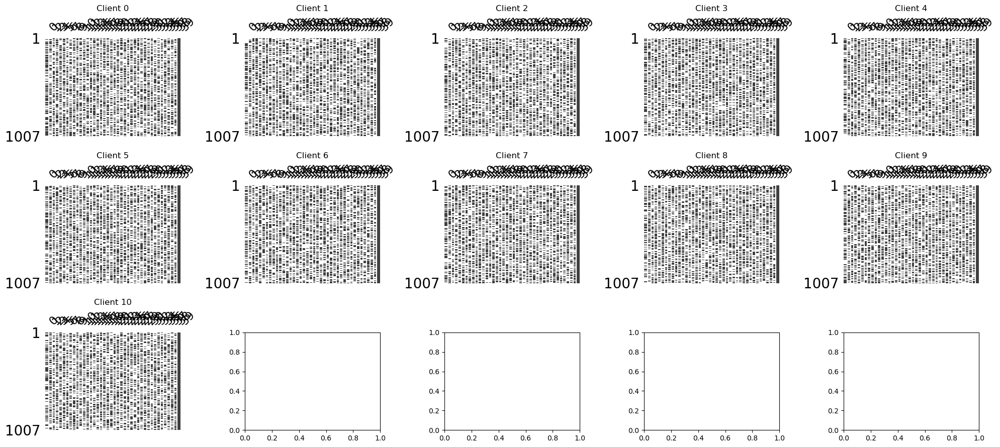

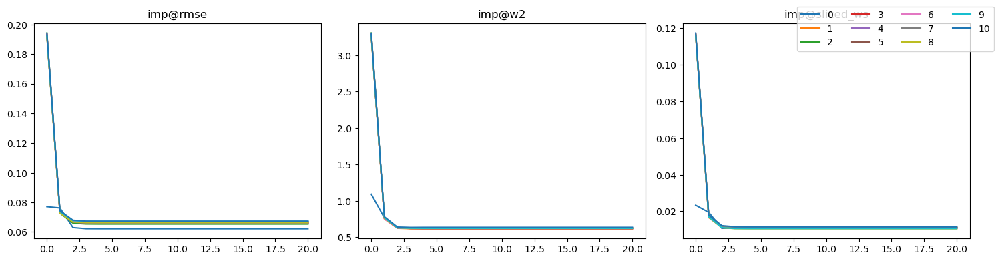

{'imp@rmse': 0.0660972440324338, 'imp@ws': 0.6247642796126843, 'imp@sliced_ws': 0.010921442720041577}


In [50]:
name = 'mnar_lr_diabetic_balanced_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [51]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_balanced_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance
)

2023-08-13 16:03:13.710 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5795 train_loss: 0.6925 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
2023-08-13 16:03:19.205 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.5711, test_f1: 0.6030 test_auroc: 0.6041 train_loss: 0.6751 val_accu: 0.5747 val_f1: 0.5676 test recall 0.6520 precision 0.5608 b-accu 0.5711
2023-08-13 16:03:24.706 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.5776, test_f1: 0.6012 test_auroc: 0.6065 train_loss: 0.6673 val_accu: 0.5783 val_f1: 0.5743 test recall 0.6374 precision 0.5689 b-accu 0.5776
2023-08-13 16:03:30.102 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.5548, test_f1: 0.3701 tes

0.5848903330625508 0.6169095132509768 0.6663055254604551


## MNAR RL Balanced

(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 16:04:13.642 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:04:13.643 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 16:05:19.234 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:05:19.234 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 16:06:31.842 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:06:31.842 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 16:06:39.177 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 147.09446360000584


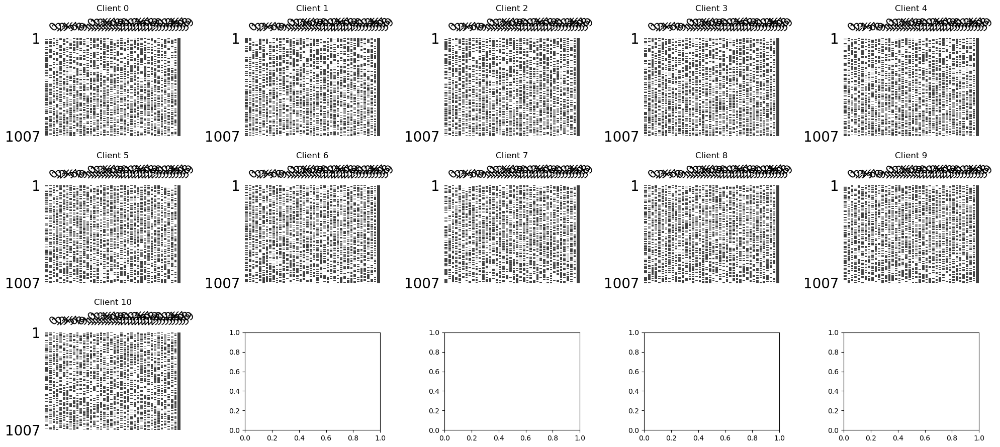

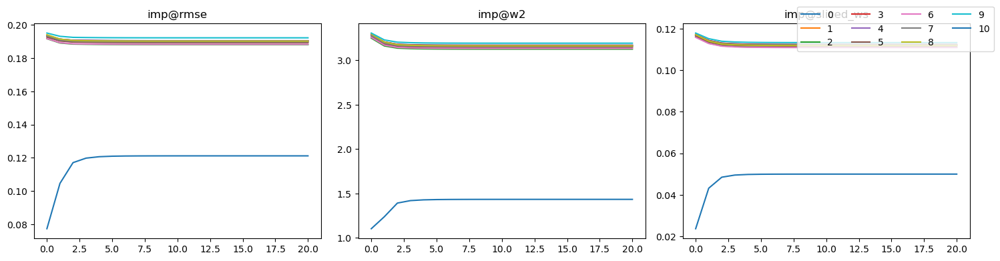

{'imp@rmse': 0.1834628636199087, 'imp@ws': 3.0015080453480363, 'imp@sliced_ws': 0.10623595106028708}


In [52]:
name = 'mnar_rl_diabetic_balanced_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [53]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_balanced_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl
)

2023-08-13 16:06:41.427 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5661 train_loss: 0.6934 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-def

0.5637692932575142 0.5938034526449161 0.6673924877517692


(101766, 50)
(69569, 43)
(12304, 40)
(11073, 40) (1231, 40)
(11073, 40)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(1231, 40)


2023-08-13 16:07:20.885 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:07:20.885 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-13 16:08:31.678 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:08:31.679 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-13 16:09:49.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-13 16:09:49.603 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-13 16:09:57.723 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 158.37089079999714


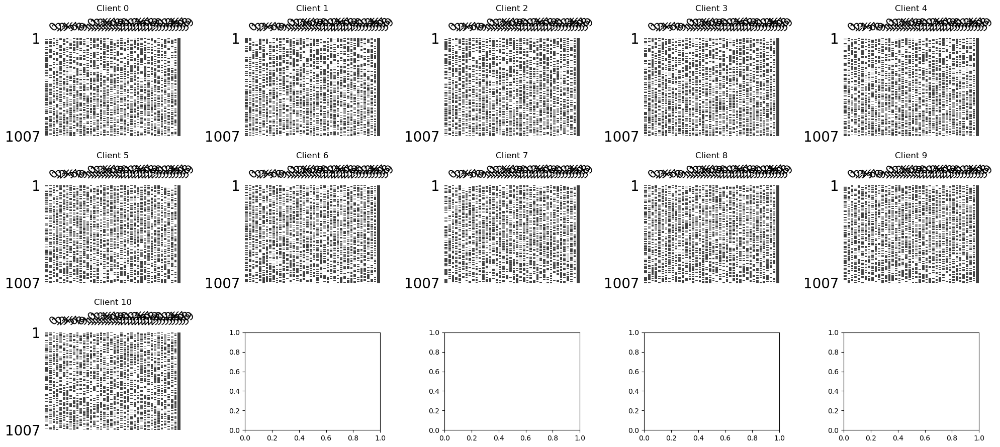

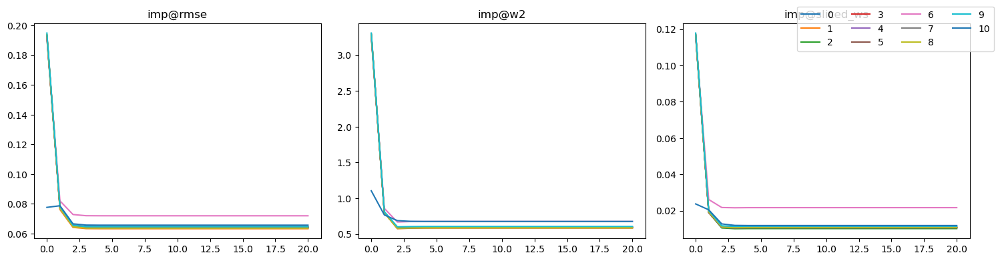

{'imp@rmse': 0.06481581530446393, 'imp@ws': 0.6070274632977812, 'imp@sliced_ws': 0.0118153631317388}


In [54]:
name = 'mnar_rl_diabetic_balanced_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic_balanced'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [55]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_balanced_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl
)

2023-08-13 16:10:00.125 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4996, test_f1: 0.6663 test_auroc: 0.5897 train_loss: 0.6927 val_accu: 0.5000 val_f1: 0.3333 test recall 1.0000 precision 0.4996 b-accu 0.5000
2023-08-13 16:10:05.944 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 50, test_accu: 0.5686, test_f1: 0.6070 test_auroc: 0.6033 train_loss: 0.6722 val_accu: 0.5792 val_f1: 0.5761 test recall 0.6667 precision 0.5571 b-accu 0.5687
2023-08-13 16:10:11.662 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 100, test_accu: 0.5768, test_f1: 0.6138 test_auroc: 0.6077 train_loss: 0.6622 val_accu: 0.5918 val_f1: 0.5875 test recall 0.6732 precision 0.5640 b-accu 0.5768
2023-08-13 16:10:17.377 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 150, test_accu: 0.5800, test_f1: 0.5279 tes

0.5913891145410236 0.6145813536057438 0.6670281995661604


## MNAR LR Raw

(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:27:51.995 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:27:51.996 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:29:19.364 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:29:19.365 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:30:51.437 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:30:51.437 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:31:00.775 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 191.75341539998772


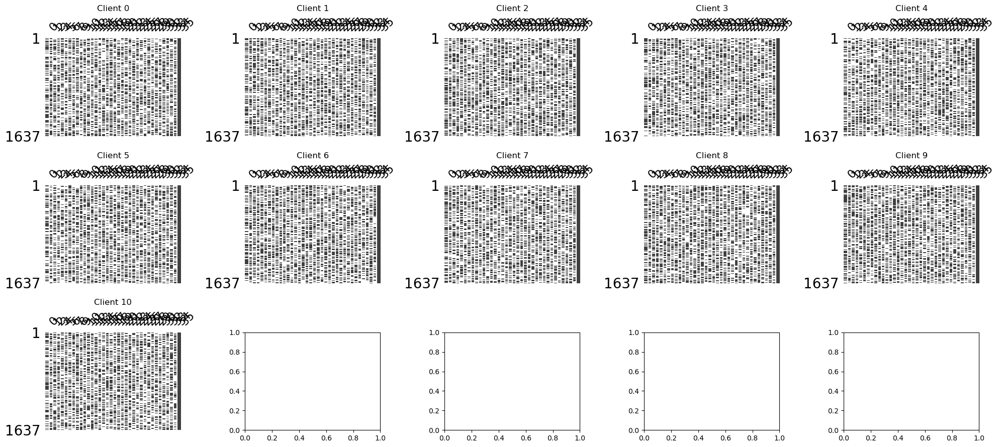

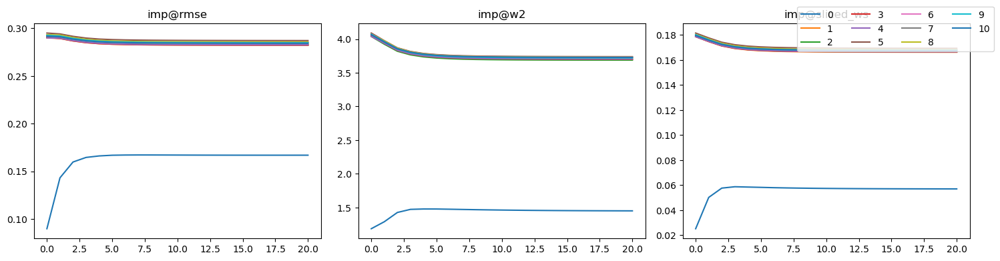

{'imp@rmse': 0.27342276583758485, 'imp@ws': 3.511075269963826, 'imp@sliced_ws': 0.15745070285530816}


In [50]:
name = 'mnar_lr_diabetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [78]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 15:43:36.503 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.2265, test_f1: 0.2175 test_auroc: 0.5932 train_loss: 0.6932 val_accu: 0.5098 val_f1: 0.4855 test recall 0.9556 precision 0.1227 b-accu 0.5448


2023-08-15 15:43:36.605 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.3755, test_f1: 0.2266 test_auroc: 0.6080 train_loss: 0.6926 val_accu: 0.5147 val_f1: 0.4865 test recall 0.8133 precision 0.1317 b-accu 0.5667
2023-08-15 15:43:36.697 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 4, test_accu: 0.2685, test_f1: 0.2206 test_auroc: 0.6192 train_loss: 0.6920 val_accu: 0.5393 val_f1: 0.5293 test recall 0.9200 precision 0.1253 b-accu 0.5530
2023-08-15 15:43:36.771 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 6, test_accu: 0.4985, test_f1: 0.2314 test_auroc: 0.6164 train_loss: 0.6913 val_accu: 0.5098 val_f1: 0.4235 test recall 0.6711 precision 0.1398 b-accu 0.5739
2023-08-15 15:43:36.850 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 8, test_accu: 0.3835, test_f1: 0.2240 test_aur

0.6885 0.6200212832550861 0.24657534246575344


(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:31:15.821 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:31:15.822 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:32:56.531 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:32:56.532 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:34:50.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:34:50.113 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:35:01.807 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 228.99875180001254


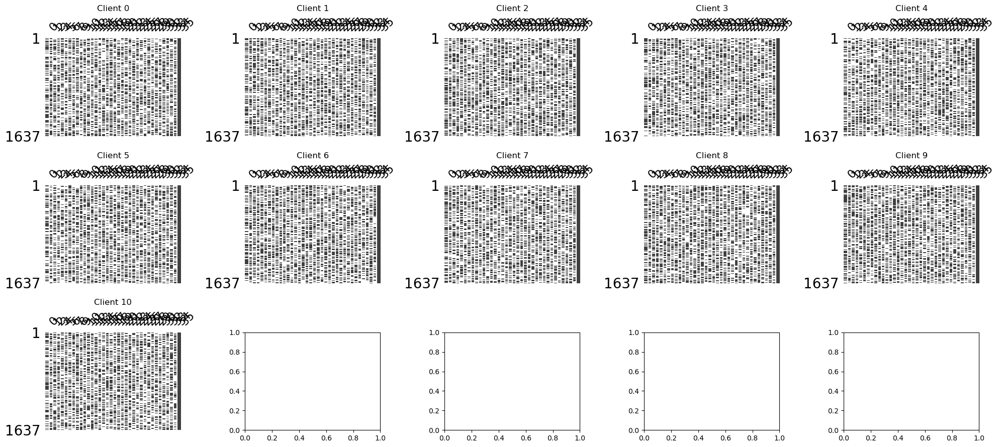

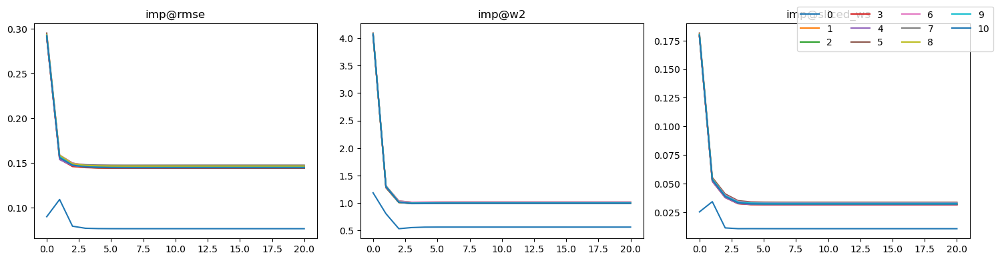

{'imp@rmse': 0.1390576853480248, 'imp@ws': 0.963563440726219, 'imp@sliced_ws': 0.030118899469288963}


In [51]:
name = 'mnar_lr_diabetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [79]:
pred_ret = NN_evaluation(
    rets['mnar_lr_diabetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 15:43:57.819 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.4845, test_f1: 0.2335 test_auroc: 0.6040 train_loss: 0.6922 val_accu: 0.5627 val_f1: 0.5584 test recall 0.6978 precision 0.1402 b-accu 0.5776
2023-08-15 15:43:57.912 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.5075, test_f1: 0.2299 test_auroc: 0.6147 train_loss: 0.6897 val_accu: 0.5688 val_f1: 0.5653 test recall 0.6533 precision 0.1395 b-accu 0.5712
2023-08-15 15:43:58.018 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 4, test_accu: 0.5670, test_f1: 0.2377 test_auroc: 0.6152 train_loss: 0.6869 val_accu: 0.5651 val_f1: 0.5650 test recall 0.6000 precision 0.1482 b-accu 0.5814
2023-08-15 15:43:58.117 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 6, test_accu: 0.6450, test_f1: 0.2398 test_aur

0.6815 0.6223824726134585 0.260593220338983


## MNAR RL RAW

(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:44:30.783 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:44:30.783 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:46:10.504 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:46:10.504 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:48:16.137 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:48:16.138 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:48:29.026 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 241.44171289997757


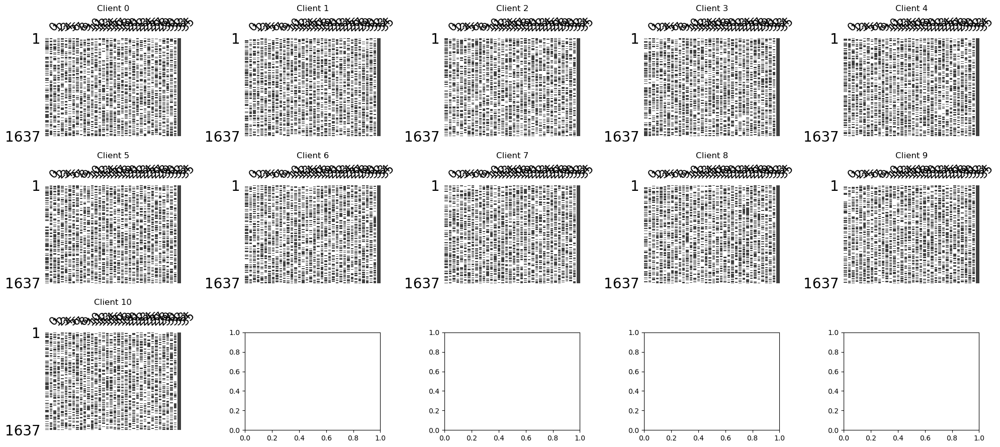

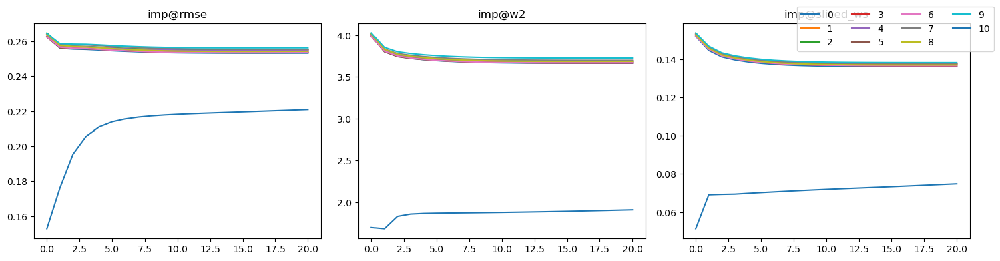

{'imp@rmse': 0.25140655448522464, 'imp@ws': 3.5236075605412593, 'imp@sliced_ws': 0.1314985732263445}


In [80]:
name = 'mnar_rl_diabetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [96]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 15:59:47.486 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.5145, test_f1: 0.2226 test_auroc: 0.5708 train_loss: 0.6924 val_accu: 0.5799 val_f1: 0.5779 test recall 0.6178 precision 0.1357 b-accu 0.5596


2023-08-15 15:59:47.528 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.6330, test_f1: 0.2354 test_auroc: 0.5798 train_loss: 0.6859 val_accu: 0.6007 val_f1: 0.5990 test recall 0.5022 precision 0.1537 b-accu 0.5759
2023-08-15 15:59:47.591 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.6205, test_f1: 0.2356 test_auroc: 0.5852 train_loss: 0.6811 val_accu: 0.5971 val_f1: 0.5967 test recall 0.5200 precision 0.1523 b-accu 0.5766
2023-08-15 15:59:47.643 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 3, test_accu: 0.6155, test_f1: 0.2394 test_auroc: 0.5889 train_loss: 0.6795 val_accu: 0.5946 val_f1: 0.5946 test recall 0.5378 precision 0.1539 b-accu 0.5816
2023-08-15 15:59:47.689 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 4, test_accu: 0.6205, test_f1: 0.2372 test_aur

0.7255 0.5969877934272301 0.24897400820793433


(101766, 50)
(99492, 43)
X_cat: (99492, 27)
(20000, 36)
(18000, 36) (2000, 36)
(18000, 36)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 36)


2023-08-15 15:48:57.413 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:48:57.414 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-15 15:50:46.208 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:50:46.209 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-15 15:52:39.152 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-15 15:52:39.153 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-15 15:52:50.451 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 236.3528633999813


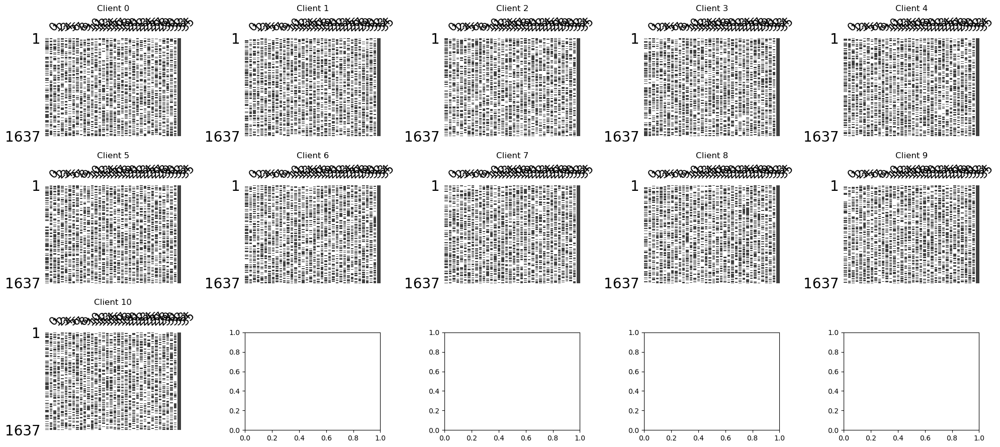

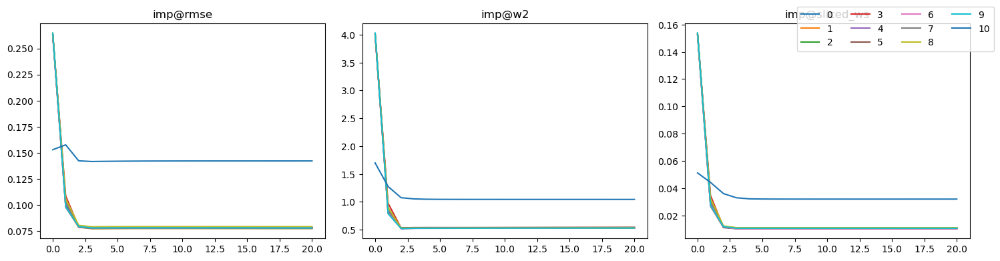

{'imp@rmse': 0.08367851250199473, 'imp@ws': 0.5799366546005541, 'imp@sliced_ws': 0.012645792566062247}


In [82]:
name = 'mnar_rl_diabetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'diabetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [97]:
pred_ret = NN_evaluation(
    rets['mnar_rl_diabetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = 'rus'
)

2023-08-15 16:00:23.133 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.6015, test_f1: 0.2402 test_auroc: 0.5888 train_loss: 0.6920 val_accu: 0.6044 val_f1: 0.6042 test recall 0.5600 precision 0.1529 b-accu 0.5834
2023-08-15 16:00:23.181 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.6080, test_f1: 0.2403 test_auroc: 0.6001 train_loss: 0.6831 val_accu: 0.6167 val_f1: 0.6162 test recall 0.5511 precision 0.1537 b-accu 0.5832
2023-08-15 16:00:23.225 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.6100, test_f1: 0.2412 test_auroc: 0.6051 train_loss: 0.6753 val_accu: 0.6204 val_f1: 0.6198 test recall 0.5511 precision 0.1544 b-accu 0.5843
2023-08-15 16:00:23.277 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 3, test_accu: 0.6055, test_f1: 0.2406 test_aur

0.735 0.6126372456964007 0.2572614107883818


# Cardio

In [42]:
trackers = {}
rets ={}
mr_strategy = 'fixed@mr=0.5'

['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:15:07.582 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:15:07.583 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:16:29.130 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:16:29.131 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:17:38.890 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:17:38.891 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:17:46.507 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 163.48836580000352


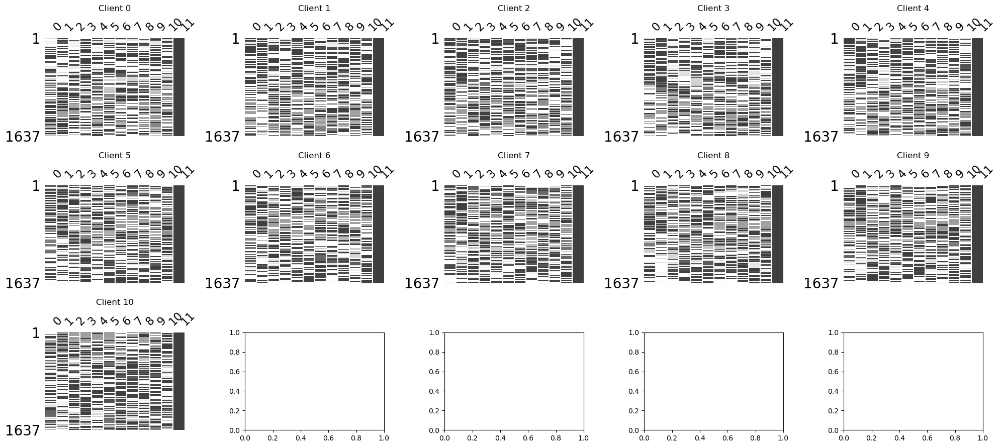

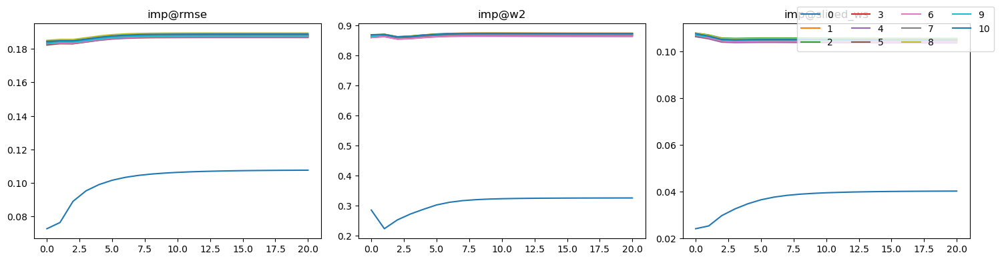

{'imp@rmse': 0.1805928921916503, 'imp@ws': 0.8211636117179579, 'imp@sliced_ws': 0.09885332860512797}


In [45]:
name = 'mnar_lr_cardio_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [46]:
pred_ret = NN_evaluation(
    rets['mnar_lr_cardio_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:17:49.559 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.5410, test_f1: 0.4339 test_auroc: 0.6688 train_loss: 0.6940 val_accu: 0.5017 val_f1: 0.3380
2023-08-03 19:17:57.442 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.4995, test_f1: 0.3331 test_auroc: 0.5020 train_loss: 0.6933 val_accu: 0.5000 val_f1: 0.3333
2023-08-03 19:18:05.596 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.5005, test_f1: 0.3336 test_auroc: 0.5020 train_loss: 0.6936 val_accu: 0.5000 val_f1: 0.3333
2023-08-03 19:18:13.301 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.4995, test_f1: 0.3331 test_auroc: 0.5020 train_loss: 0.6932 val_accu: 0.5000 val_f1: 0.3333
2023-08-03 19:18:20.776 | INFO     | src.fed_imp.sub_modules.server.pred_server_centr

0.5835 0.6825971825971826 0.5403162767494678


['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:21:07.852 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:21:07.853 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:22:13.165 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:22:13.165 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:23:27.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:23:27.163 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:23:34.960 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 151.88568760000635


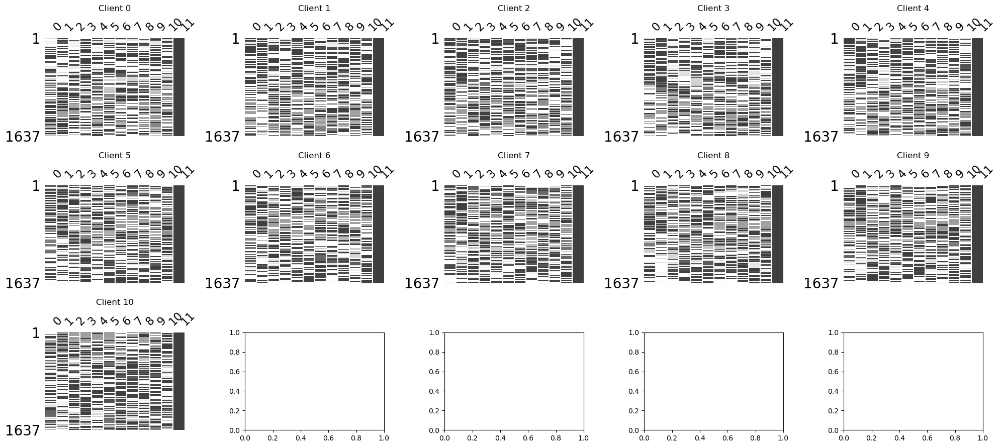

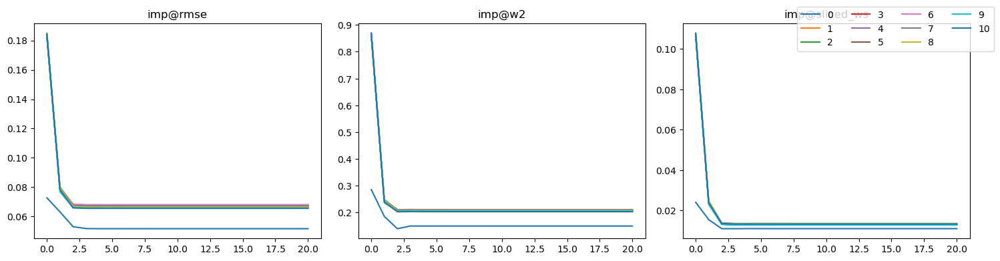

{'imp@rmse': 0.06543817506394098, 'imp@ws': 0.20229980583053633, 'imp@sliced_ws': 0.013060052115186857}


In [47]:
name = 'mnar_lr_cardio_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [48]:
pred_ret = NN_evaluation(
    rets['mnar_lr_cardio_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:23:38.051 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.6680, test_f1: 0.6674 test_auroc: 0.7506 train_loss: 0.6565 val_accu: 0.6912 val_f1: 0.6911
2023-08-03 19:23:45.786 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.7190, test_f1: 0.7170 test_auroc: 0.7877 train_loss: 0.5774 val_accu: 0.7273 val_f1: 0.7266
2023-08-03 19:23:53.256 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.7160, test_f1: 0.7139 test_auroc: 0.7878 train_loss: 0.5737 val_accu: 0.7195 val_f1: 0.7179
2023-08-03 19:24:00.885 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.7100, test_f1: 0.7069 test_auroc: 0.7873 train_loss: 0.5709 val_accu: 0.7201 val_f1: 0.7193
2023-08-03 19:24:08.911 | INFO     | src.fed_imp.sub_modules.server.pred_server_centr

0.7265 0.7922517922517921 0.7264999316249829


['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:27:17.562 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:27:17.563 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:28:24.723 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:28:24.723 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:29:33.111 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:29:33.112 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:29:40.181 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 147.21332359994994


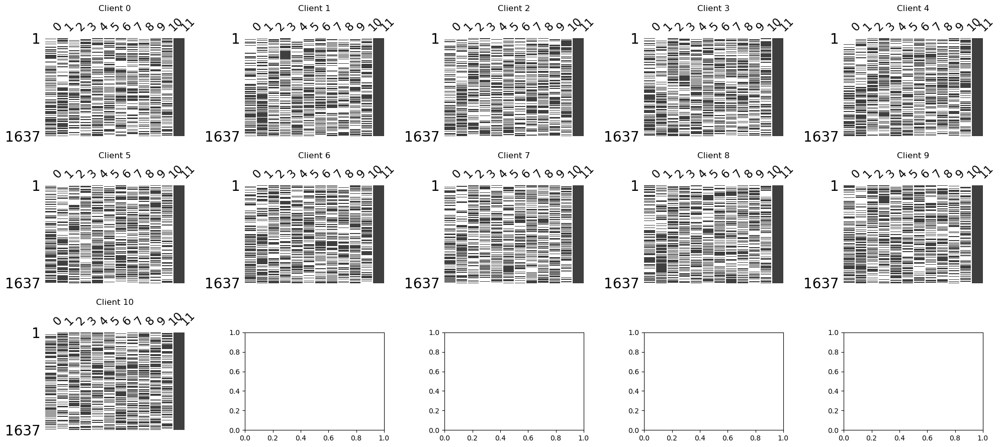

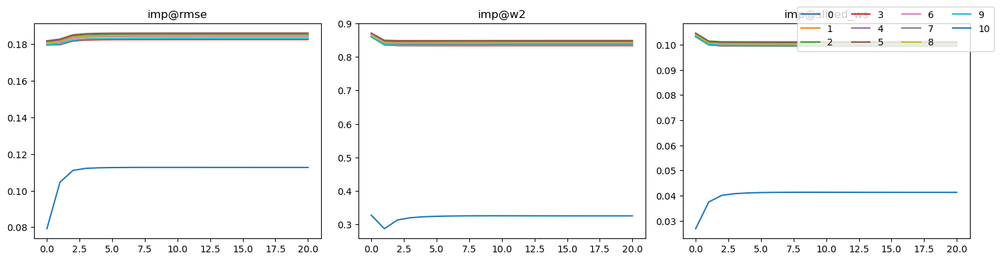

{'imp@rmse': 0.17795875628492033, 'imp@ws': 0.7944499369117158, 'imp@sliced_ws': 0.0949492538761867}


In [49]:
name = 'mnar_rl_cardio_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [50]:
pred_ret = NN_evaluation(
    rets['mnar_rl_cardio_fedavg-s'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:29:42.958 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.5970, test_f1: 0.5701 test_auroc: 0.6067 train_loss: 0.6906 val_accu: 0.6247 val_f1: 0.6176
2023-08-03 19:29:50.591 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.6730, test_f1: 0.6728 test_auroc: 0.7311 train_loss: 0.6363 val_accu: 0.6610 val_f1: 0.6571
2023-08-03 19:29:57.859 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.6820, test_f1: 0.6820 test_auroc: 0.7392 train_loss: 0.6270 val_accu: 0.6655 val_f1: 0.6607
2023-08-03 19:30:05.200 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.6800, test_f1: 0.6799 test_auroc: 0.7245 train_loss: 0.6230 val_accu: 0.6727 val_f1: 0.6693
2023-08-03 19:30:12.549 | INFO     | src.fed_imp.sub_modules.server.pred_server_centr

0.688 0.745974245974246 0.6879472630874618


['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'NEW_AGE', 'NEW_BMI', 'BLOOD_PRESSURE']
(70000, 20)
(70000, 12)
(20000, 12)
11
1.0    10011
0.0     9989
Name: count, dtype: int64
(18000, 12) (2000, 12)
(18000, 12)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 12)


2023-08-03 19:32:56.555 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:32:56.555 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-03 19:33:59.802 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:33:59.803 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-03 19:35:14.830 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-03 19:35:14.831 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-03 19:35:22.460 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 150.49200660001952


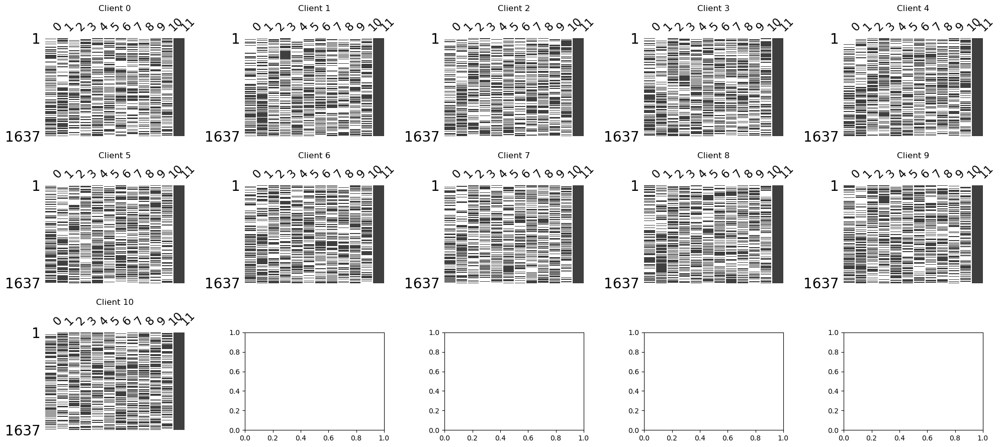

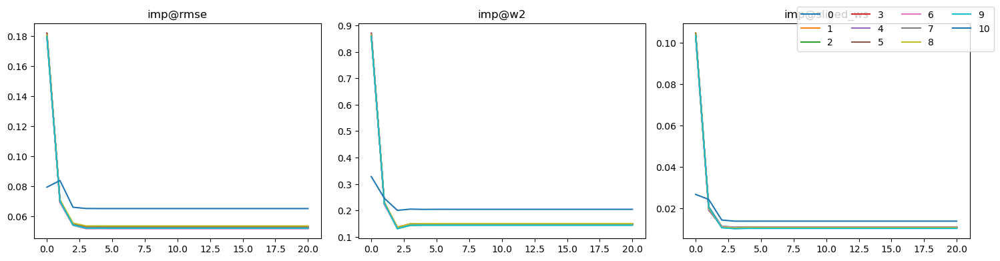

{'imp@rmse': 0.053483969634496406, 'imp@ws': 0.15272740569858834, 'imp@sliced_ws': 0.011088363895667294}


In [51]:
name = 'mnar_rl_cardio_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'cardio'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [52]:
pred_ret = NN_evaluation(
    rets['mnar_rl_cardio_fedmechw'], type='centralized', n_rounds=500, server_config_tmpl = server_config_tmpl
)

(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)
(1637, 11) (1637,)
(1637, 11) (1637,) (2000, 11) (2000,)


2023-08-03 19:35:25.497 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 0, test_accu: 0.6895, test_f1: 0.6881 test_auroc: 0.7636 train_loss: 0.6305 val_accu: 0.7043 val_f1: 0.7042
2023-08-03 19:35:32.399 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 20, test_accu: 0.7160, test_f1: 0.7147 test_auroc: 0.7826 train_loss: 0.5654 val_accu: 0.7226 val_f1: 0.7201
2023-08-03 19:35:40.070 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 40, test_accu: 0.7130, test_f1: 0.7106 test_auroc: 0.7831 train_loss: 0.5600 val_accu: 0.7201 val_f1: 0.7161
2023-08-03 19:35:48.517 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:179 - Round: 60, test_accu: 0.7170, test_f1: 0.7144 test_auroc: 0.7876 train_loss: 0.5635 val_accu: 0.7192 val_f1: 0.7151


# MIMIC III MORTALITY

(20000, 51)
mortality
0    14556
1     5444
Name: count, dtype: int64
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-08-17 00:47:31.743 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-17 00:47:31.744 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1


KeyboardInterrupt: 

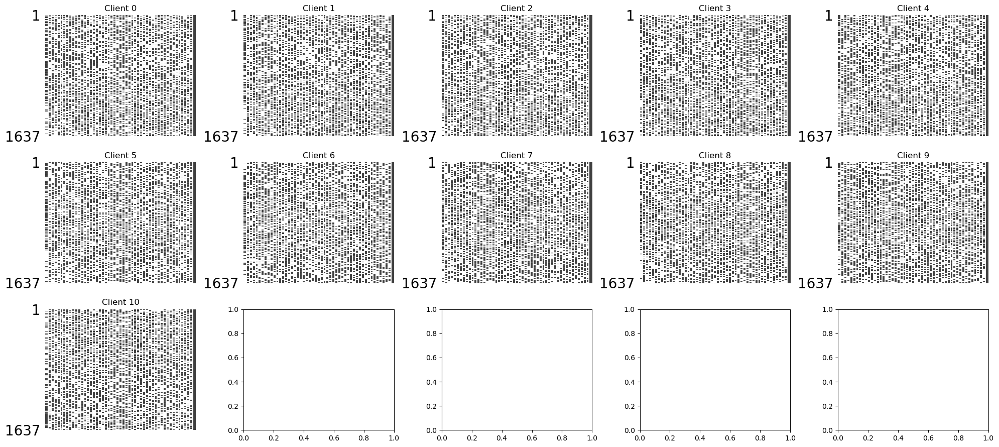

In [63]:
name = 'mnar_rl_mimicmo_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo2'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

(20000, 41)
ICD9_GROUP
5     7991
7     2449
1     2082
4     1308
2     1126
0     1022
3      891
8      847
11     719
9      702
6      451
10     412
Name: count, dtype: int64
(18000, 41) (2000, 41)
(18000, 41)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 41)


2023-08-17 00:47:48.844 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-17 00:47:48.844 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1


KeyboardInterrupt: 

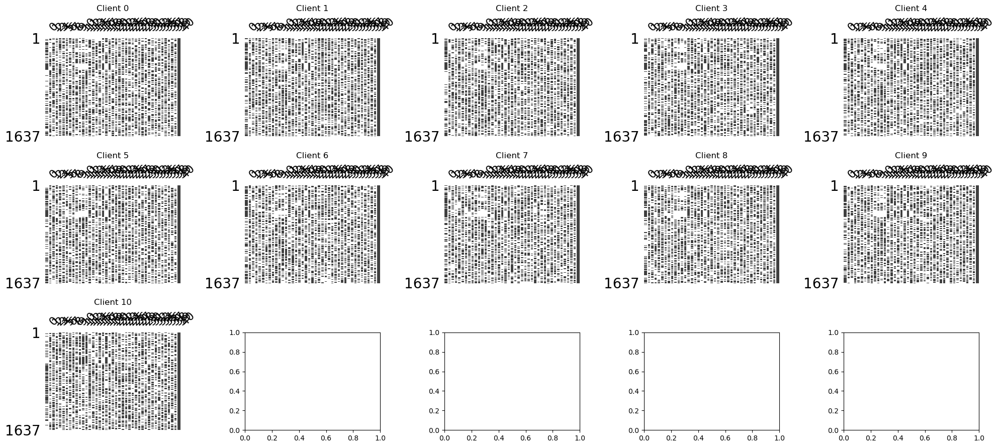

In [64]:
name = 'mnar_rl_mimicmo_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_icd'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [61]:
pred_ret = NN_evaluation(
    rets['mnar_rl_mimicmo_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

ValueError: multiclass format is not supported

(4156450, 19)
(58976, 22)
(46491, 18)
(46491, 96)
(38857, 41)
(38857, 61)
(20000, 61)
mortality
0    14142
1     5858
Name: count, dtype: int64
(18000, 61) (2000, 61)
(18000, 61)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 61)


2023-08-16 09:34:29.123 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:34:29.124 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:37:22.275 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:37:22.275 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:40:36.103 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:40:36.103 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:40:54.470 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 387.95476370002143


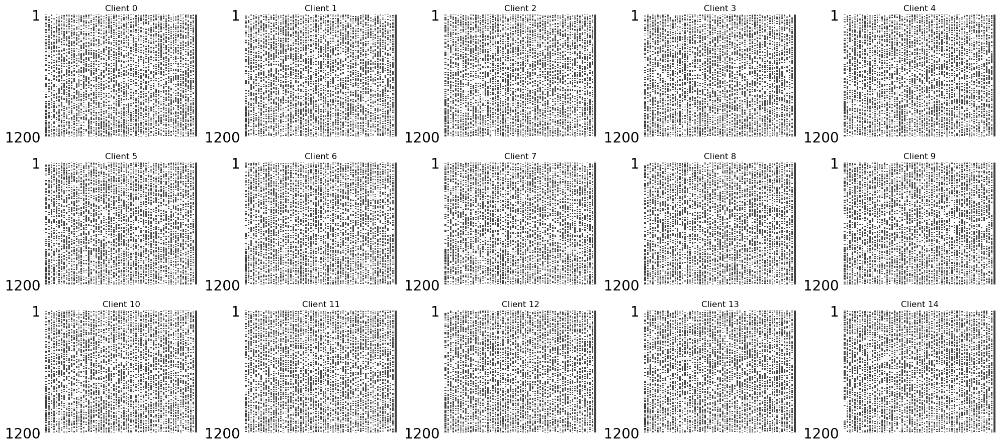

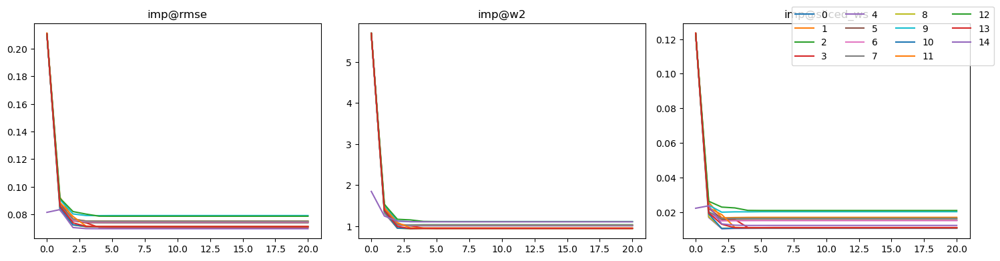

{'imp@rmse': 0.07341203876768884, 'imp@ws': 1.009889162306651, 'imp@sliced_ws': 0.014199697993315595}


In [117]:
name = 'mnar_rl_mimicmo_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo'
config2['handle_imbalance'] = None
config2['num_clients'] = 15
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [118]:
pred_ret = NN_evaluation(
    rets['mnar_rl_mimicmo_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

m:\miniconda3\envs\fed_imp\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-08-16 09:40:55.643 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 0, test_accu: 0.7070, test_f1: 0.0000 test_auroc: 0.8284 train_loss: 0.6032 val_accu: 0.7083 val_f1: 0.4146 test recall 0.0000 precision 0.0000 b-accu 0.5000
2023-08-16 09:40:55.778 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 1, test_accu: 0.7745, test_f1: 0.3762 test_auroc: 0.8754 train_loss: 0.5263 val_accu: 0.7711 val_f1: 0.6100 test recall 0.2321 precision 0.9927 b-accu 0.6157
2023-08-16 09:40:55.906 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:186 - Round: 2, test_accu: 0.8380, test_f

0.858 0.9047928805557299 0.7269372693726937


# MIMICIII LOS

(20000, 51)
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-08-20 19:54:38.254 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 19:54:38.255 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-20 19:57:33.172 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 19:57:33.172 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-20 20:00:47.720 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:00:47.721 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-20 20:01:01.971 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 386.39866740000434


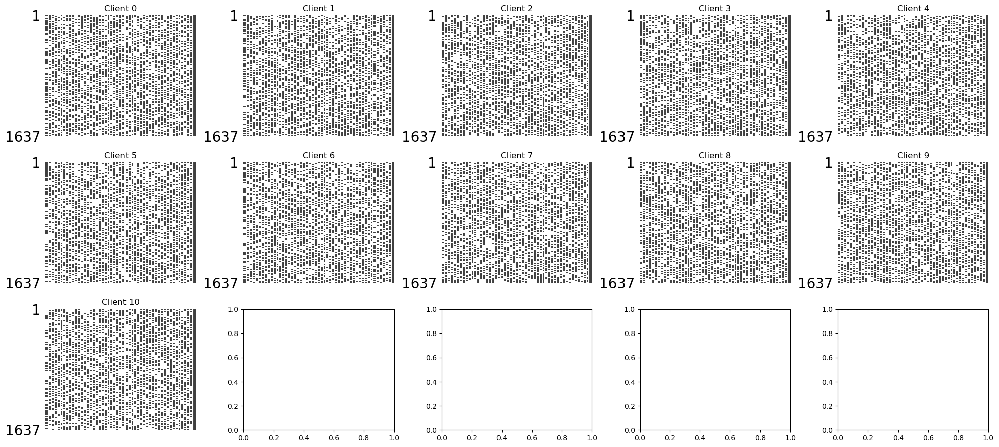

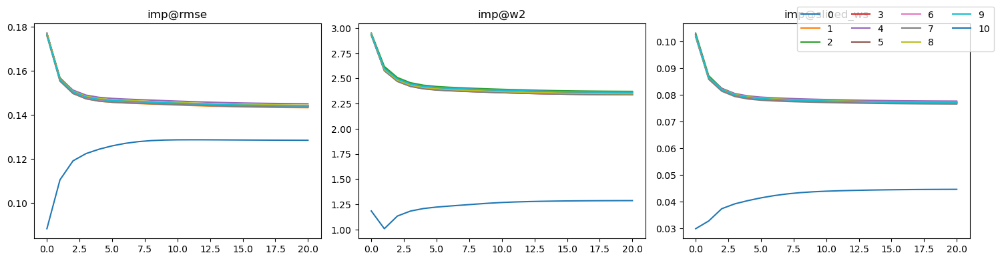

{'imp@rmse': 0.14269867194717897, 'imp@ws': 2.2563689936082825, 'imp@sliced_ws': 0.07414163390828002}


In [6]:
name = 'mnar_rl_mimiclos_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_los'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

(20000, 51)
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-08-20 20:01:32.508 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:01:32.509 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-20 20:03:44.886 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:03:44.887 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-20 20:06:06.307 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-20 20:06:06.307 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-20 20:06:20.189 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 290.579703800031


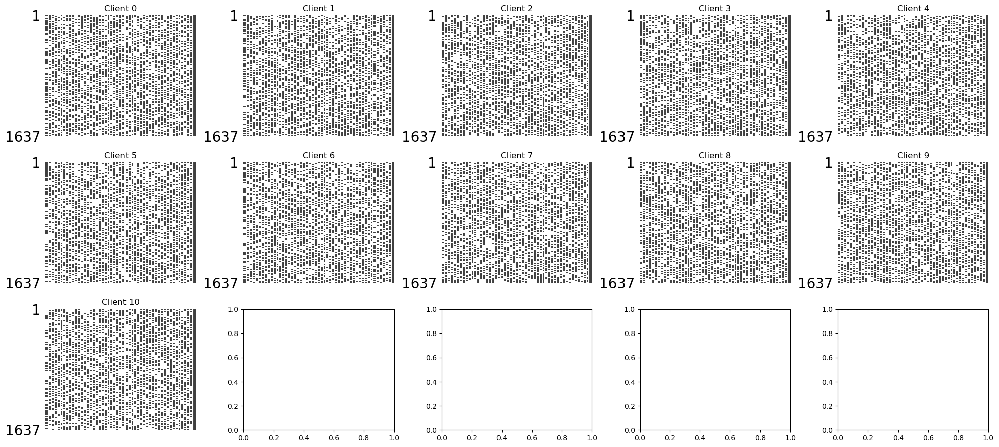

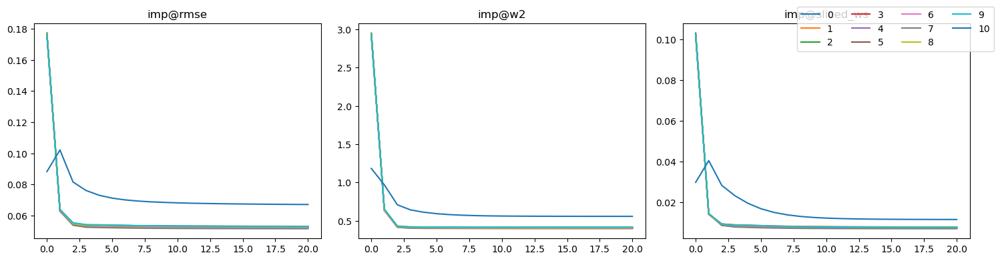

{'imp@rmse': 0.05380920966955938, 'imp@ws': 0.42096792122636717, 'imp@sliced_ws': 0.007984998409465961}


In [7]:
name = 'mnar_rl_mimiclos_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_los'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

# Genetic

Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:48:55.589 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:48:55.590 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:50:10.815 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:50:10.815 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:51:28.889 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:51:28.889 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:51:36.726 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 163.8380214999779


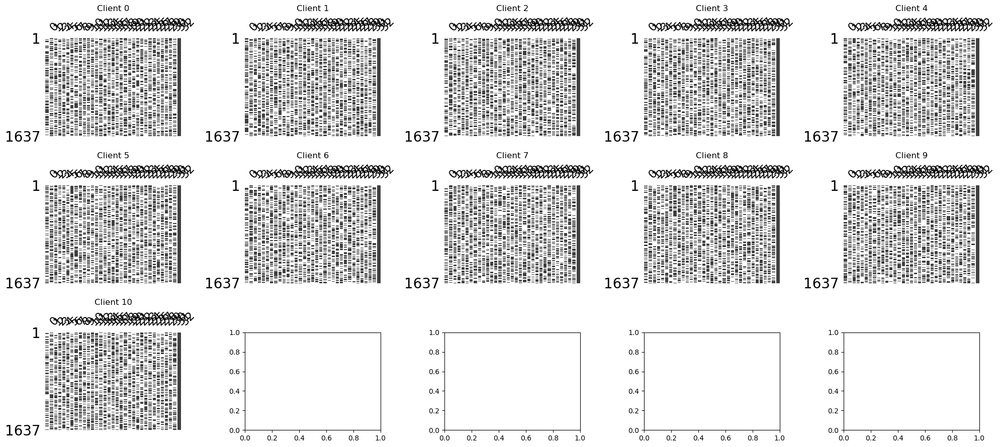

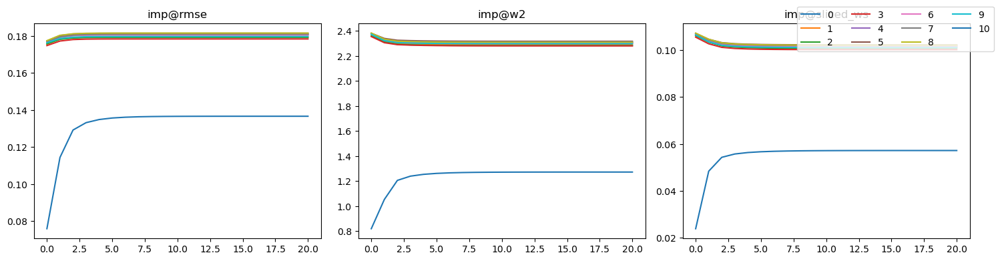

{'imp@rmse': 0.17629010620295868, 'imp@ws': 2.2071112336612475, 'imp@sliced_ws': 0.09742176082373848}


In [6]:
name = 'mnar_rl_genetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [54]:
pred_ret = NN_evaluation(
    rets['mnar_rl_genetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:05:36.891 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.4993 test_auprc: 0.2515 train_loss: 0.5755 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:05:37.046 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5315 test_auprc: 0.2692 train_loss: 0.5617 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:05:37.187 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5568 test_auprc: 0.2860 train_loss: 0.5615 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:05:37.332 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5842 test_auprc: 0.3067 train_loss: 0.5607 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.753 0.2566137566137566 0.653776573800499 0.3788621721596042


Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:51:45.166 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:51:45.166 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:52:57.852 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:52:57.853 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:54:19.223 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:54:19.224 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:54:27.353 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 164.76211860001786


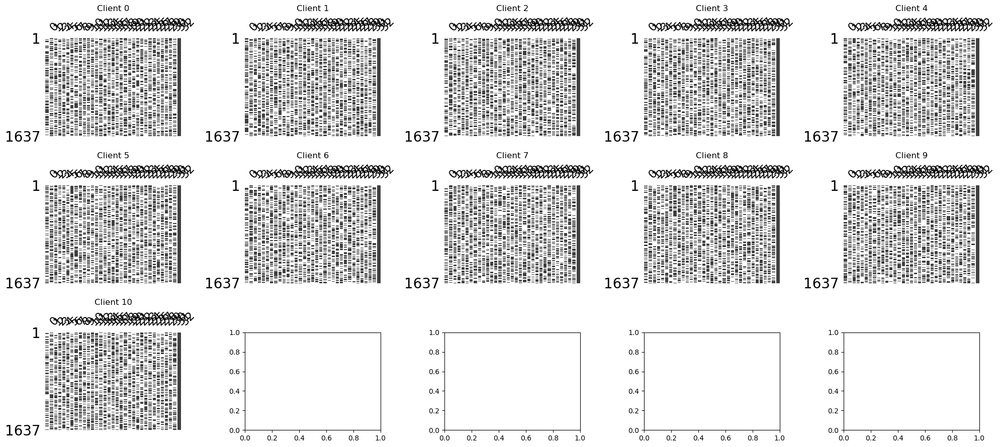

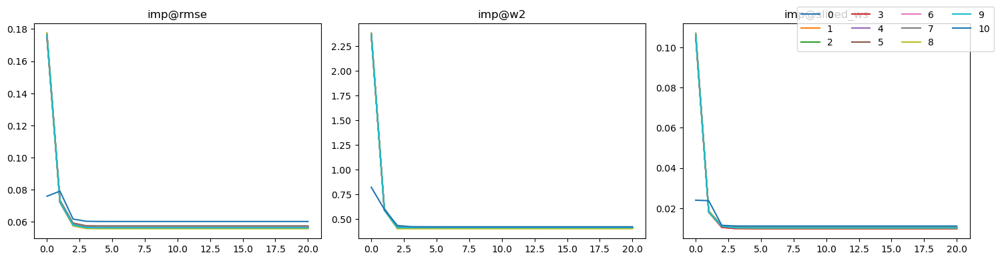

{'imp@rmse': 0.05683915396535701, 'imp@ws': 0.41200755567497166, 'imp@sliced_ws': 0.010124558245875855}


In [7]:
name = 'mnar_rl_genetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremer1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [55]:
pred_ret = NN_evaluation(
    rets['mnar_rl_genetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:06:12.556 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5426 test_auprc: 0.2762 train_loss: 0.5757 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:12.670 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6116 test_auprc: 0.3255 train_loss: 0.5588 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:12.779 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6446 test_auprc: 0.3574 train_loss: 0.5533 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:12.888 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6529 test_auprc: 0.3651 train_loss: 0.5445 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.7555 0.39679715302491103 0.6701317358234123 0.3816156290790693


Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:54:35.991 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:54:35.991 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:55:41.313 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:55:41.314 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:56:57.006 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:56:57.007 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 09:57:04.776 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 151.45910480001476


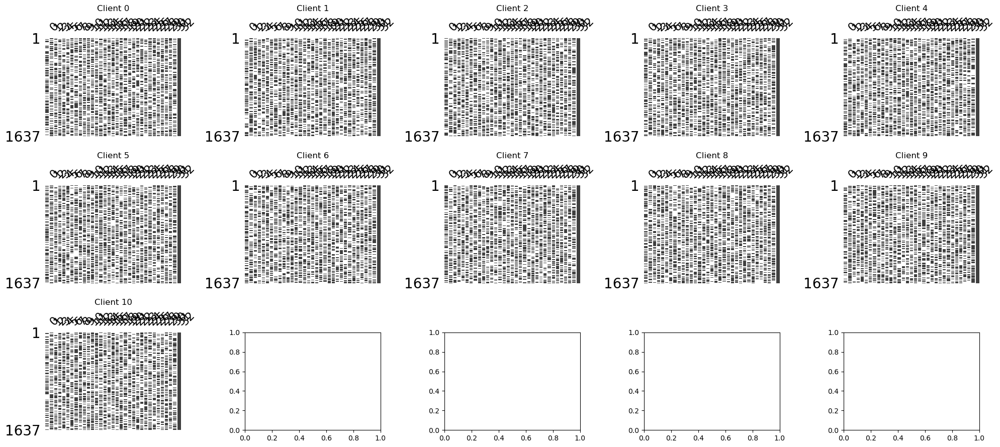

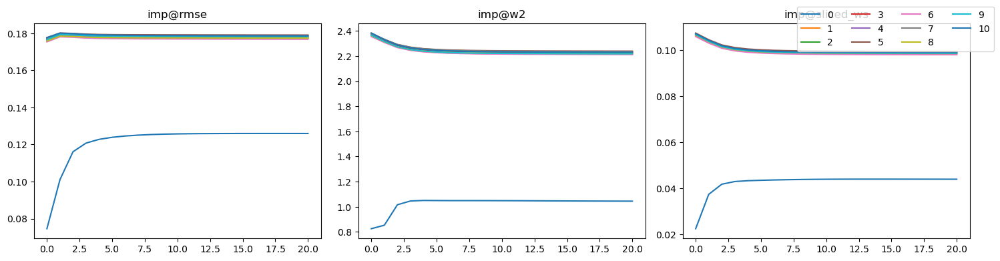

{'imp@rmse': 0.17323219195260878, 'imp@ws': 2.1175038781347433, 'imp@sliced_ws': 0.09374673964282788}


In [8]:
name = 'mnar_lr_genetic_fedavg-s'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedavg-s'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [56]:
pred_ret = NN_evaluation(
    rets['mnar_lr_genetic_fedavg-s'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:06:47.231 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.4892 test_auprc: 0.2391 train_loss: 0.5778 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:47.345 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5242 test_auprc: 0.2599 train_loss: 0.5628 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:47.456 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5491 test_auprc: 0.2783 train_loss: 0.5619 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:06:47.566 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5635 test_auprc: 0.2899 train_loss: 0.5605 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.7525 0.31739572736520855 0.630966129460787 0.34453231830756986


Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
11
[1, 10]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-08-16 09:57:13.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:57:13.601 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 1
2023-08-16 09:58:30.076 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:58:30.076 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 10
2023-08-16 09:59:56.533 | INFO     | src.fed_imp.sub_modules.server.base_server:run:148 - ==================================================
2023-08-16 09:59:56.533 | INFO     | src.fed_imp.sub_modules.server.base_server:run:149 - Imputation Round 20
2023-08-16 10:00:05.356 | INFO     | src.fed_imp.sub_modules.server.base_server:run:178 - FL finished in 174.45900879998226


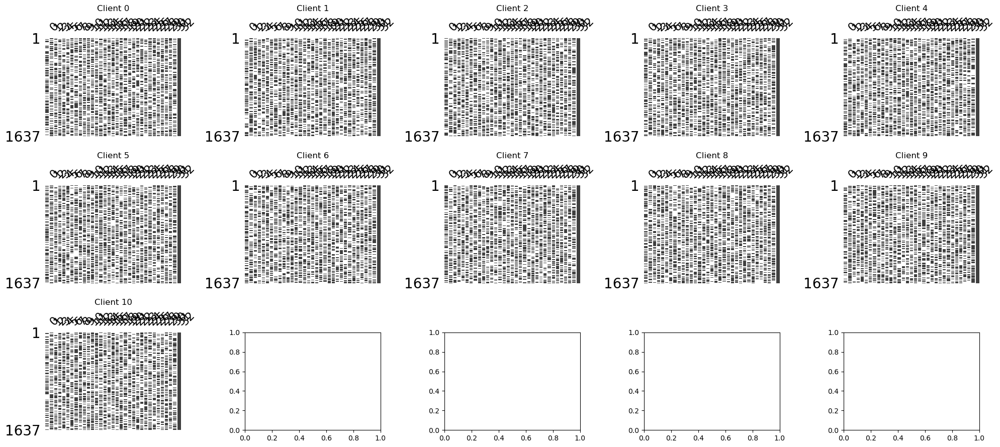

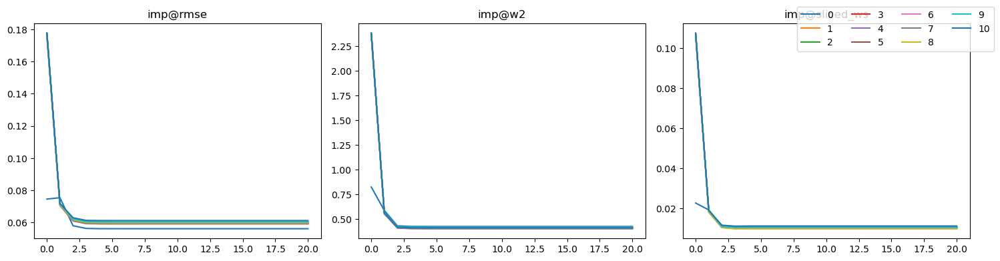

{'imp@rmse': 0.059586867172133684, 'imp@ws': 0.4136522421771314, 'imp@sliced_ws': 0.010196954033889441}


In [9]:
name = 'mnar_lr_genetic_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['handle_imbalance'] = None
config2['num_clients'] = 11
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2['agg_strategy_imp']['strategy'] = 'fedmechw'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

In [57]:
pred_ret = NN_evaluation(
    rets['mnar_lr_genetic_fedmechw'], type='centralized', n_rounds=300, server_config_tmpl = server_config_tmpl, imbalance = None
)

2023-08-16 17:07:21.984 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 0, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.5515 test_auprc: 0.2790 train_loss: 0.5760 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:07:22.091 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 1, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6231 test_auprc: 0.3327 train_loss: 0.5587 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:07:22.340 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 2, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6458 test_auprc: 0.3563 train_loss: 0.5530 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 17:07:22.456 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:195 - Round: 3, test_accu: 0.7505, test_f1: 0.0000 test_auroc: 0.6523 test_auprc: 0.3665 train_loss: 0.5444 val_accu: 0.7500 val_f1: 0.4286
2023-08-16 1

0.7545 0.39065108514190316 0.6818500425234213 0.3927096190113667


# Freeze MM Model

## CODON

### S1

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
sample sizes:  [3903, 3903, 3903]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-11-03 17:26:16.501 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:26:16.502 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 17:26:45.641 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:26:45.642 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 17:27:17.717 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:27:17.719 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 17:27:20.891 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 66.36456959997304


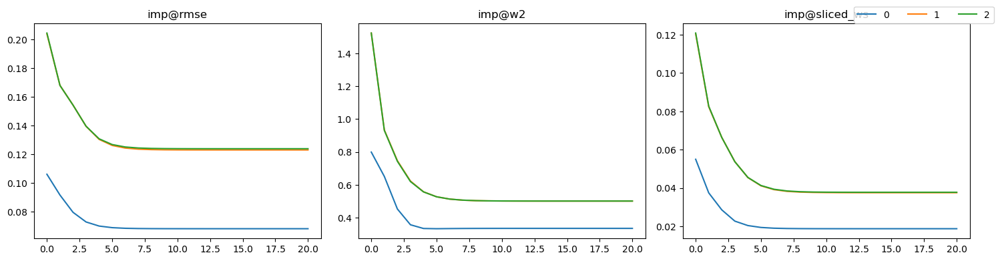

{'imp@rmse': 0.10501826908593896, 'imp@ws': 0.44447337306424795, 'imp@sliced_ws': 0.03130914271774519}


In [25]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  30
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
sample sizes:  [3903, 3903, 3903]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-11-03 17:23:59.349 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:23:59.350 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 17:24:28.533 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:24:28.534 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10


idx: [1 2]
cmp: [0.94519761 0.95032448]
smp: [1. 1.]
idx: [2 0]
cmp: [0.00194564 0.94519761]
smp: [1. 1.]
idx: [1 0]
cmp: [0.00194564 0.95032448]
smp: [1. 1.]
[1952.0001 1952.0001 1952.0001]
idx: [1 2]
cmp: [0.89372312 0.89592452]
smp: [1. 1.]
idx: [2 0]
cmp: [5.61675589e-04 8.93723122e-01]
smp: [1. 1.]
idx: [1 0]
cmp: [5.61675589e-04 8.95924522e-01]
smp: [1. 1.]
[1952.0001 1952.0001 1952.0001]
idx: [2 1]
cmp: [0.97359667 0.9744379 ]
smp: [1. 1.]
idx: [2 0]
cmp: [0.0024941 0.9744379]
smp: [1. 1.]
idx: [1 0]
cmp: [0.0024941  0.97359667]
smp: [1. 1.]
[1952.0001 1952.0001 1952.0001]
idx: [1 2]
cmp: [0.96999683 0.97315954]
smp: [1. 1.]
idx: [2 0]
cmp: [0.00364569 0.96999683]
smp: [1. 1.]
idx: [1 0]
cmp: [0.00364569 0.97315954]
smp: [1. 1.]
[1952.0001 1952.0001 1952.0001]
idx: [1 2]
cmp: [0.96868478 0.97272104]
smp: [1. 1.]
idx: [2 0]
cmp: [0.00350983 0.96868478]
smp: [1. 1.]
idx: [1 0]
cmp: [0.00350983 0.97272104]
smp: [1. 1.]
[1952.0001 1952.0001 1952.0001]
idx: [1 2]
cmp: [0.93911989 0.9

2023-11-03 17:25:00.868 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:25:00.868 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 17:25:04.090 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 66.79384619998746


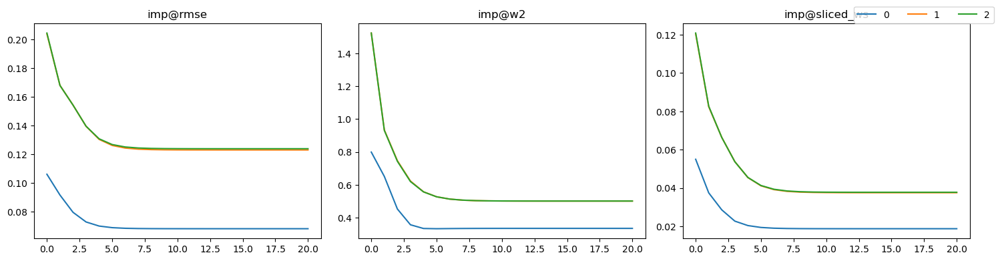

{'imp@rmse': 0.10501937107157294, 'imp@ws': 0.4444850795999108, 'imp@sliced_ws': 0.03130905045027175}


In [23]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  1
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

### S2

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
sample sizes:  [1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171]
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-11-03 17:58:55.369 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:58:55.370 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 17:59:29.703 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:59:29.704 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 18:00:08.353 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:00:08.353 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 18:00:12.443 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 78.49799249996431


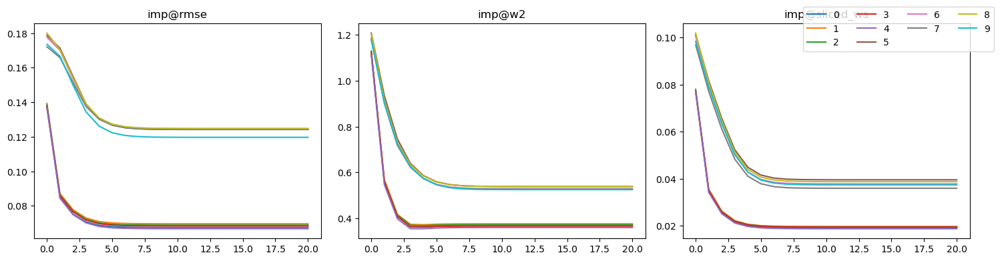

{'imp@rmse': 0.09587923240633037, 'imp@ws': 0.4495152132083387, 'imp@sliced_ws': 0.028621111553090755}


In [35]:
name = 'tests1_1'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.5'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  30
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

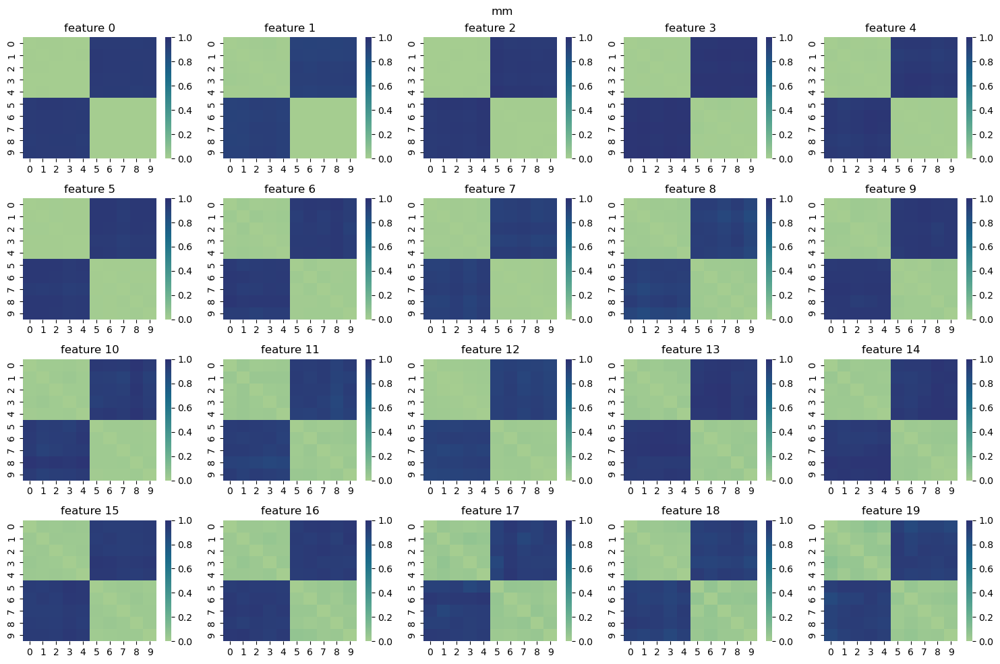

In [66]:
vis_local_model_sim(trackers['tests1_1'], iteration = 1, model = 'mm')

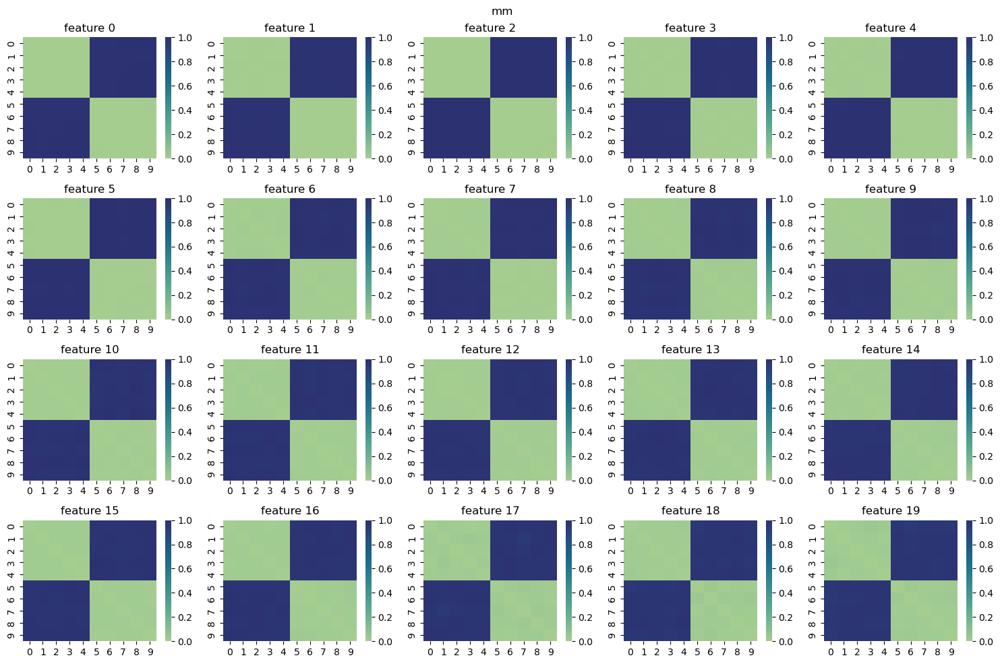

In [67]:
vis_local_model_sim(trackers['tests1_1'], iteration = 10, model = 'mm')

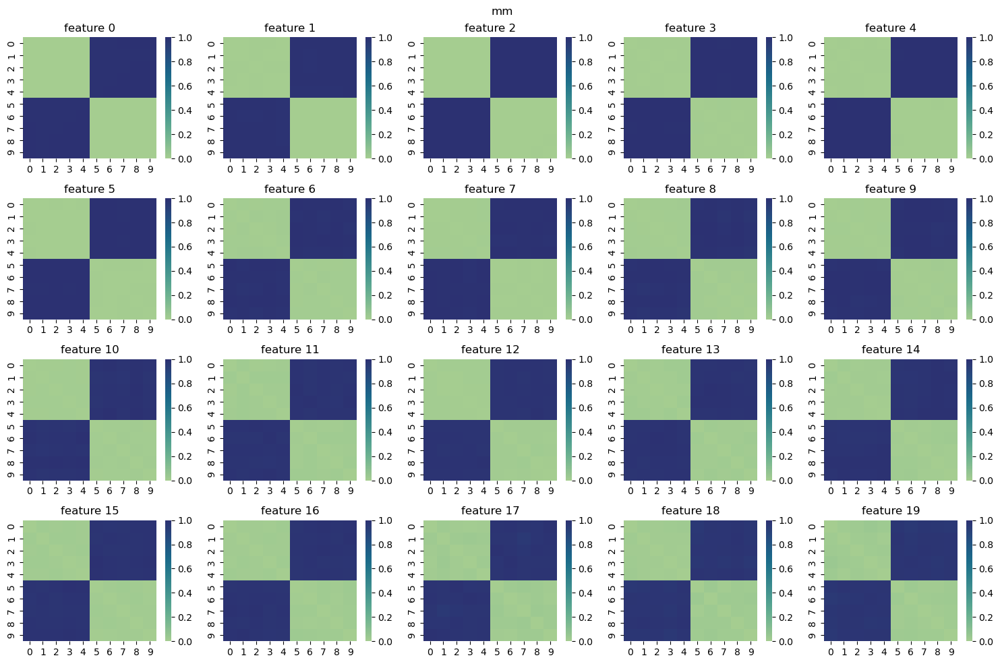

In [68]:
vis_local_model_sim(trackers['tests1_1'], iteration = 20, model = 'mm')

(13008, 26)
(11707, 26) (1301, 26)
(11707, 26)
sample-evenly {}
sample sizes:  [1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171]
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(1301, 26)


2023-11-03 18:14:29.214 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:14:29.214 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 18:15:04.693 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:15:04.694 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 18:15:45.063 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:15:45.064 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 18:15:49.061 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 81.57562480005436


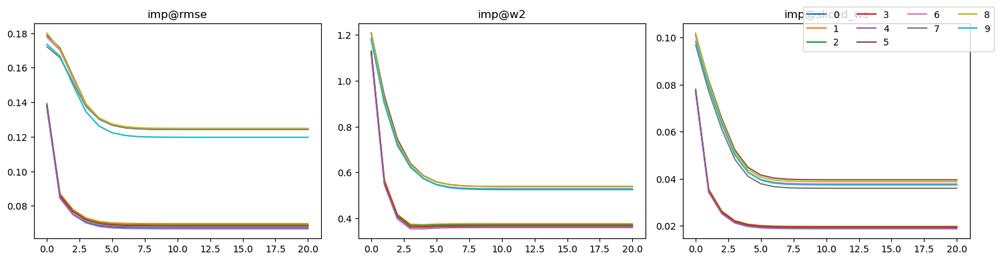

{'imp@rmse': 0.09588741591076592, 'imp@ws': 0.44950358869740553, 'imp@sliced_ws': 0.02860849278923034}


In [70]:
name = 'tests1_2'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'codon'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.5'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  1
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

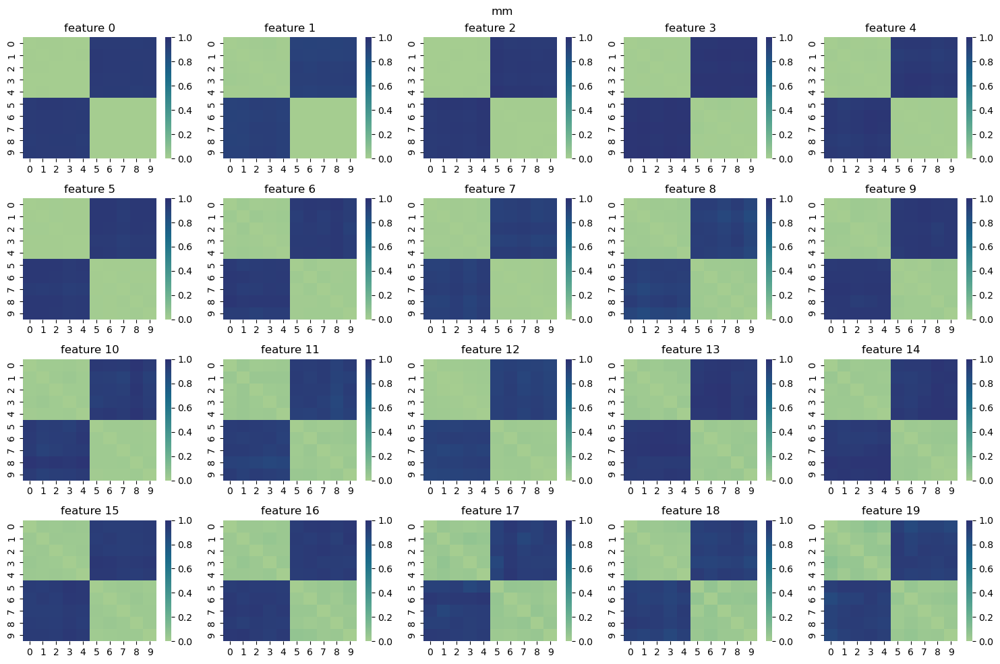

In [71]:
vis_local_model_sim(trackers['tests1_2'], iteration = 1, model = 'mm')

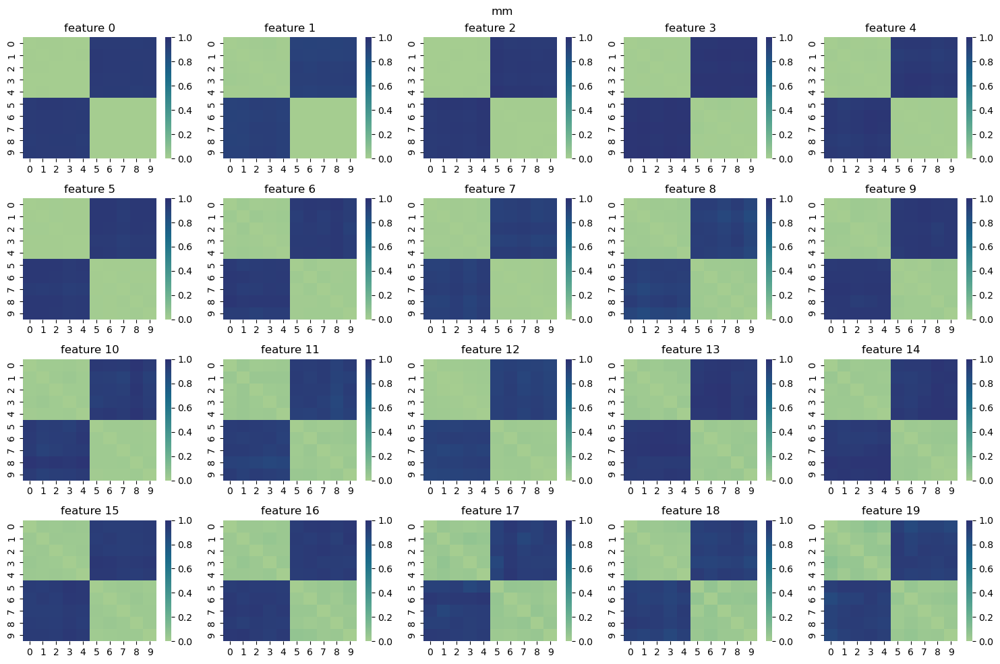

In [72]:
vis_local_model_sim(trackers['tests1_2'], iteration = 10, model = 'mm')

## GENETIC

Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
sample sizes:  [6000, 6000, 6000]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-11-03 17:28:58.004 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:28:58.004 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 17:31:35.424 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:31:35.425 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 17:34:30.818 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:34:30.819 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 17:34:48.348 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 353.60773789999075


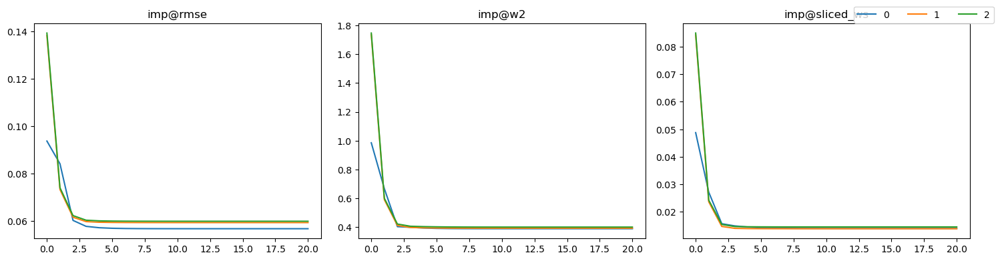

{'imp@rmse': 0.05868539861174013, 'imp@ws': 0.39458401870678445, 'imp@sliced_ws': 0.014074406743867082}


In [26]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  30
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

Index(['CLNDISDBINCL', 'CLNDNINCL', 'CLNSIGINCL', 'SSR', 'DISTANCE',
       'MOTIF_NAME', 'MOTIF_POS', 'HIGH_INF_POS', 'MOTIF_SCORE_CHANGE'],
      dtype='object')
(65188, 217)
(65188, 12)
(65188, 230)
(20000, 33)
CLASS
0    15007
1     4993
Name: count, dtype: int64
(18000, 33) (2000, 33)
(18000, 33)
sample-evenly {}
sample sizes:  [6000, 6000, 6000]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 33)


2023-11-03 17:34:55.186 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:34:55.187 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 17:37:32.507 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:37:32.508 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 17:40:27.304 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 17:40:27.305 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 17:40:44.794 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 352.7675642000977


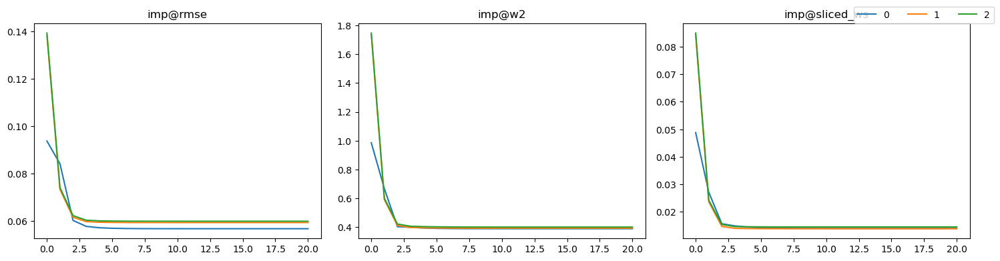

{'imp@rmse': 0.058681976251331446, 'imp@ws': 0.39457466582087475, 'imp@sliced_ws': 0.014070128065682929}


In [27]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'genetic'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  1
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

## MIMICIII_MO

### S1

(20000, 51)
mortality
0    14556
1     5444
Name: count, dtype: int64
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
sample sizes:  [6000, 6000, 6000]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-11-03 18:16:48.744 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:16:48.744 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 18:20:55.414 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:20:55.415 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 18:25:29.825 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:25:29.825 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 18:25:57.102 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 551.7053787999321


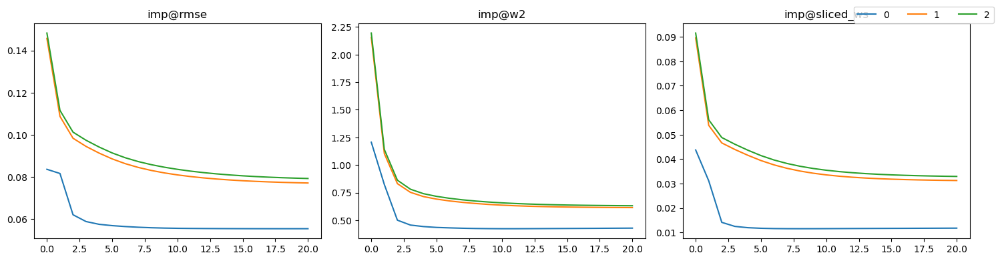

{'imp@rmse': 0.07093380778949333, 'imp@ws': 0.5586002609576431, 'imp@sliced_ws': 0.025396102815065318}


In [73]:
name = 'mnar_lr_heart_fedmechw'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo2'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  30
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

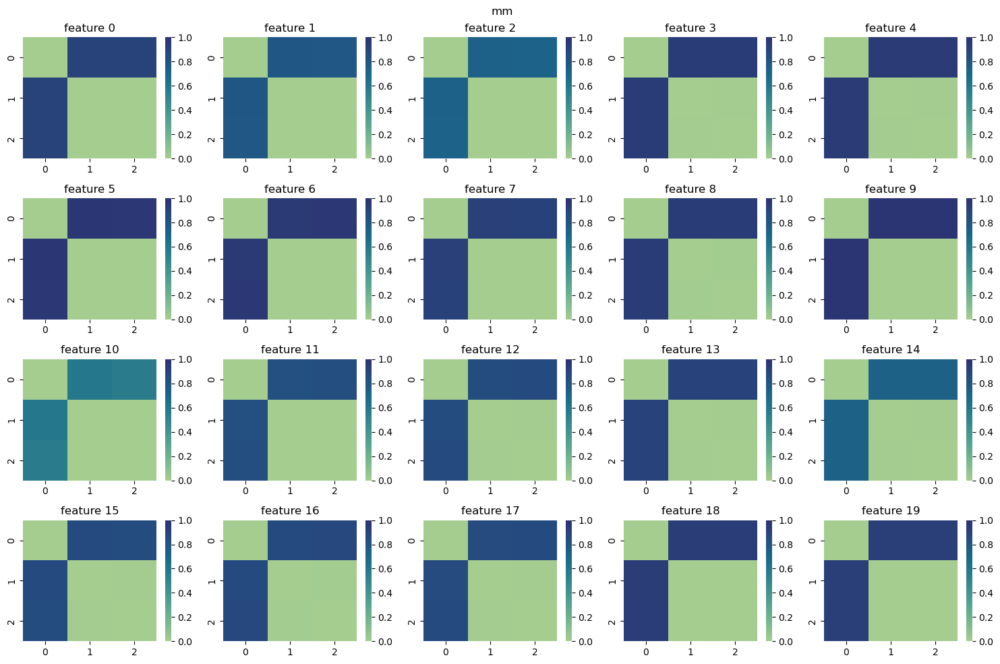

In [77]:
vis_local_model_sim(trackers['mnar_lr_heart_fedmechw'], iteration = 1, model = 'mm')

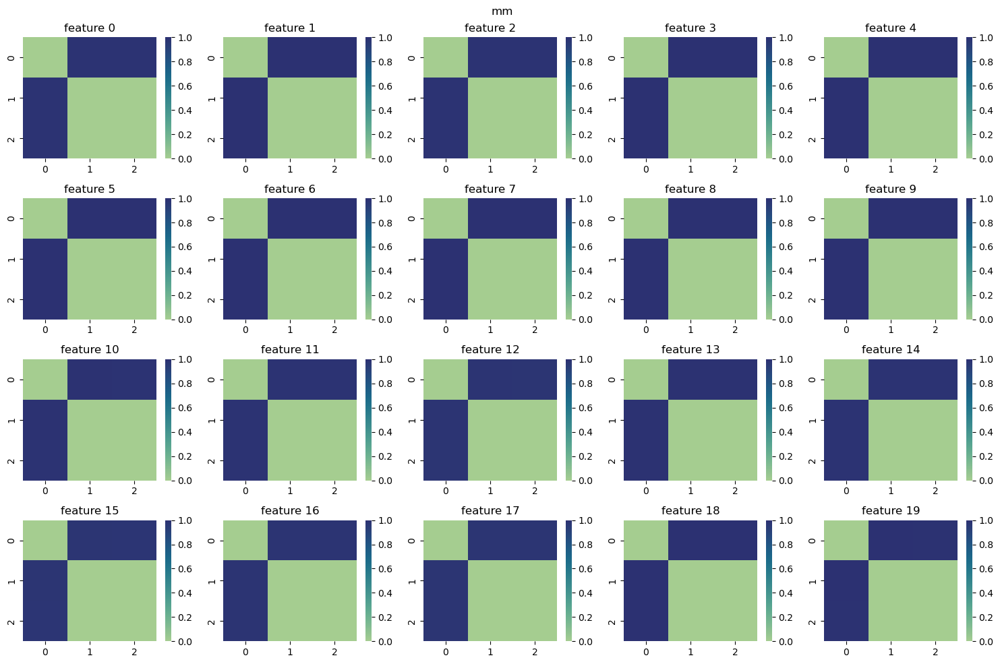

In [78]:
vis_local_model_sim(trackers['mnar_lr_heart_fedmechw'], iteration = 10, model = 'mm')

(20000, 51)
mortality
0    14556
1     5444
Name: count, dtype: int64
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
sample sizes:  [6000, 6000, 6000]
3
[1, 2]
[['mnar_quantile_left']]
[['mnar_quantile_left'], ['mnar_quantile_right', 'mnar_quantile_right']]
['mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-11-03 18:26:01.016 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:26:01.017 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 18:30:07.305 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:30:07.306 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 18:34:39.382 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:34:39.382 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 18:35:06.651 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 548.9470768999308


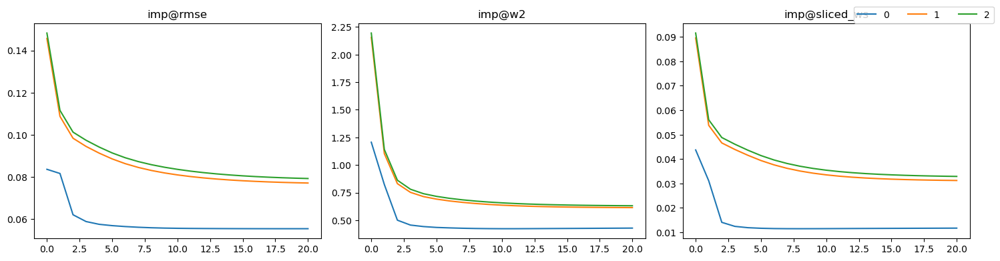

{'imp@rmse': 0.0709218779523323, 'imp@ws': 0.5587379103006737, 'imp@sliced_ws': 0.025396245844910983}


In [74]:
name = 'mimiciii_f'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo2'
config2['num_clients'] = 3
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extremel1'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  1
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

### S2

(20000, 51)
mortality
0    14556
1     5444
Name: count, dtype: int64
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
sample sizes:  [1800, 1800, 1800, 1800, 1800, 1800, 1800, 1800, 1800, 1800]
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-11-03 18:35:10.066 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:35:10.066 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 18:37:05.900 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:37:05.901 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 18:39:12.627 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:39:12.628 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 18:39:25.297 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 257.9964759000577


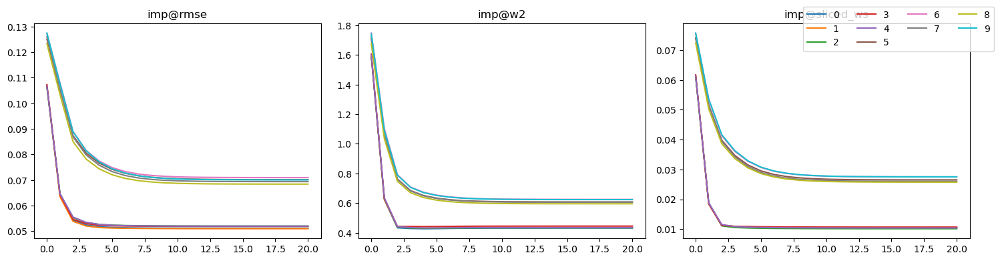

{'imp@rmse': 0.06067714850344977, 'imp@ws': 0.5238453810450378, 'imp@sliced_ws': 0.018537354369335242}


In [75]:
name = 'mimiciii_s2'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo2'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.5'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  30
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

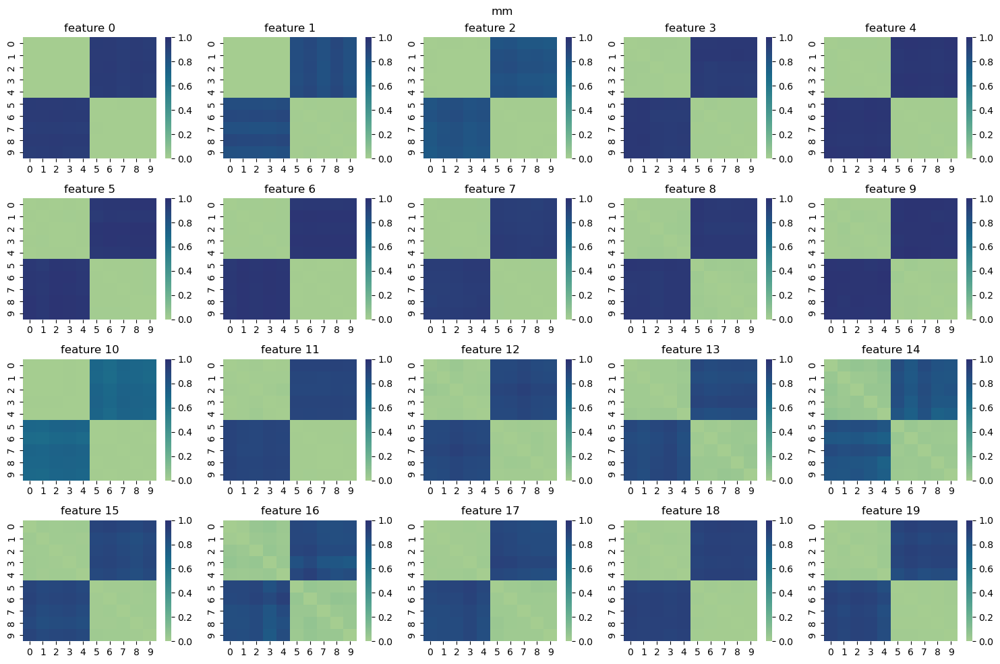

In [79]:
vis_local_model_sim(trackers['mimiciii_s2'], iteration = 1, model = 'mm')

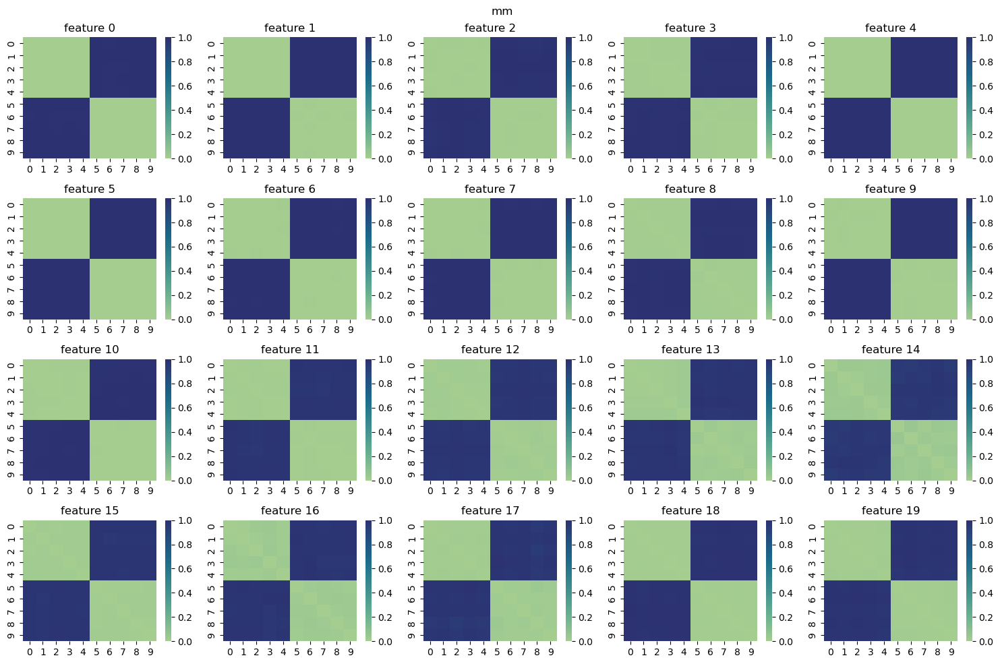

In [80]:
vis_local_model_sim(trackers['mimiciii_s2'], iteration = 10, model = 'mm')

(20000, 51)
mortality
0    14556
1     5444
Name: count, dtype: int64
(18000, 51) (2000, 51)
(18000, 51)
sample-evenly {}
sample sizes:  [1800, 1800, 1800, 1800, 1800, 1800, 1800, 1800, 1800, 1800]
['mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_left@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5', 'mnar_quantile_right@0.5']
(2000, 51)


2023-11-03 18:39:28.995 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:39:28.996 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 1
2023-11-03 18:41:23.515 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:41:23.515 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 10
2023-11-03 18:43:27.294 | INFO     | src.fed_imp.sub_modules.server.base_server:run:151 - ==================================================
2023-11-03 18:43:27.294 | INFO     | src.fed_imp.sub_modules.server.base_server:run:152 - Imputation Round 20
2023-11-03 18:43:39.988 | INFO     | src.fed_imp.sub_modules.server.base_server:run:181 - FL finished in 253.95874210004695


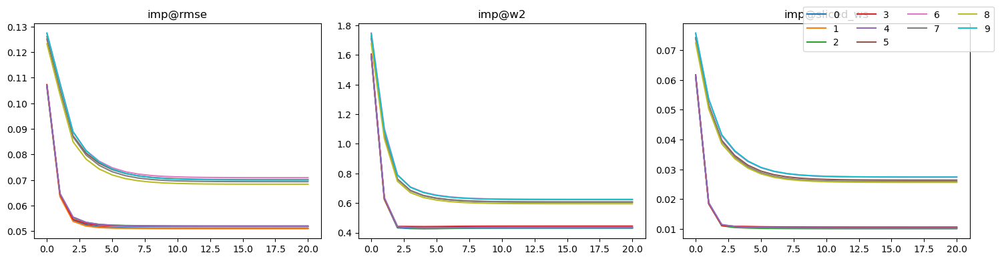

{'imp@rmse': 0.06065610149403008, 'imp@ws': 0.5232047675242125, 'imp@sliced_ws': 0.018491594926825488}


In [76]:
name = 'mimiciii_s2f'
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'mimiciii_mo2'
config2['num_clients'] = 10
config2['missing_simulate']['mr_strategy'] = mr_strategy
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_lr@sp=extreme_r=0.5'
config2['data_partition']['strategy'] = 'sample-evenly'

config2["server"]["froze_ms_coefs_round"] =  1
config2["server"]["imp_round"] = 20
config2["algo_params"]["fedmechw_new"] = {
    "alpha": 0.95,
    "gamma": 0.05,
    "client_thres": 1.0,
    "scale_factor": 4
}

config2['agg_strategy_imp']['strategy'] = 'fedmechw_new'
config2['server_type'] = 'fedavg_pytorch'
config2['prediction'] = False
config2['save_state'] = True
config2['track'] = True

clients, test_data, new_seed = simulate_scenario(config2)
print(test_data.shape)
server, ret = run_simulation(config2, clients, test_data, new_seed)
trackers[name] = copy.deepcopy(server.stats_tracker)
rets[name] = ret.copy()

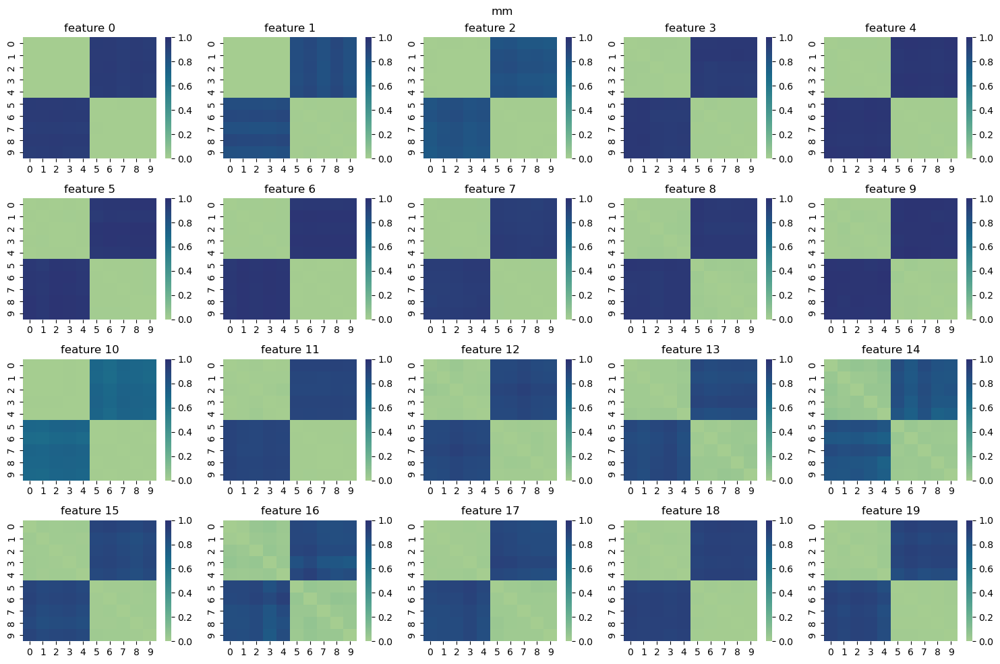

In [81]:
vis_local_model_sim(trackers['mimiciii_s2f'], iteration = 1, model = 'mm')

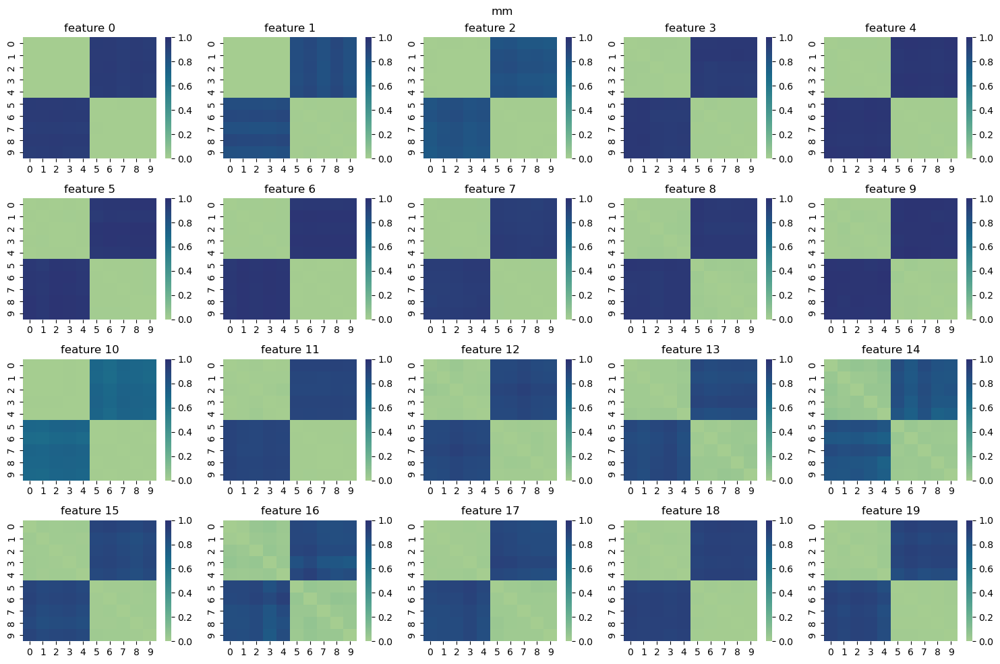

In [82]:
vis_local_model_sim(trackers['mimiciii_s2f'], iteration = 10, model = 'mm')